# Combined paper figures
Order: 1, S1, 2, S2, 3, S3, S4, 4, 5, 6, 7, S5, S6

## Purpose & Figure Order
This notebook reproduces only the saved paper figures from the CYGNSS DA analysis. It is arranged so shared inputs are loaded once and figures are generated in the exact order required for distribution.

Figure order (saved to `paper_figures/`):
1. Figure 1
2. Figure S1
3. Figure 2
4. Figure S2
5. Figure 3
6. Figure S3
7. Figure S4
8. Figure 4
9. Figure 5
10. Figure 6
11. Figure 7
12. Figure S5
13. Figure S6


## Requirements
Python packages needed (install in your environment):
- numpy
- scipy
- pandas
- xarray
- matplotlib
- cartopy
- netCDF4
- seaborn
- python-dateutil


## Prerequisites & Data Layout
Inputs are expected in the flat directory `projects/cygnss_da/notebooks/cygnss_da_combined_inputs`.
`DATA_DIR` is defined near the top of the notebook and points to that folder via `repo_root`.

Notes on filenames:
- DA/SSA/ALL temporal and spatial stats are prefixed by experiment (e.g., `CYG_DA_temporal_stats_20180801_20240630.nc4`).
- All other inputs are stored by their original basenames.

Required Python packages: `numpy`, `scipy`, `pandas`, `xarray`, `matplotlib`, `cartopy`, `netCDF4`, `seaborn`.
Repo helper functions are inlined in this notebook (no external module dependencies).

## Execution Notes
- Run top-to-bottom to ensure variables are defined in order.
- Cells are grouped so large datasets are loaded once; re-running isolated sections may require re-running their upstream inputs.
- Figures are saved to `paper_figures/` as PNG and PDF and will be overwritten on re-run.

## Outputs & Naming Conventions
Saved files (PNG and PDF) are written to `paper_figures/` with these base names:
- figure_1
- figure_S1
- figure_2
- figure_S2
- figure_3
- figure_S3
- figure_S4
- figure_4
- figure_5
- figure_6_n{Nmin}_v2
- figure_7_n{Nmin}_v2
- figure_S5
- figure_S6

In [1]:
from pathlib import Path

# Ensure repo utils are on path and import region bounds/helpers
def find_repo_root(start: Path) -> Path:
    for p in [start] + list(start.parents):
        if (p / '.git').exists():
            return p
    return start

here = Path(_file_).resolve().parent if '_file_' in globals() else Path.cwd()
repo_root = find_repo_root(here)

In [2]:
DATA_DIR = repo_root / 'projects' / 'cygnss_da' / 'notebooks' / 'cygnss_da_combined_inputs'

In [3]:
# Local helpers (inlined from repo modules)
import struct
import numpy as np

REGION_BOUNDS = {
    'global':       [-180, 180, -60, 85],
    'north_america': [-125, -66.5, 24.5, 49.5],
    'australia':    [112, 154, -39, -10],
    'tibet':        [73, 105, 26, 40],
    'south_america': [0, 45, -36, -10],
    'conus':        [-125, -66.0, 24.0, 50.0],
    'cygnss':     [-140, 180, -40, 40]
}

def load_ease_grid(ease_path=None):
    """
    Load EASE grid from bundled binaries. If ease_path is None, use the
    packaged files under common/python/plotting/ease_grids.
    """
    if ease_path is None:
        here = Path(_file_).resolve().parent
        ease_path = here / 'ease_grids'
    ease_path = Path(ease_path)
    lats = np.fromfile(ease_path / 'EASE2_M36km.lats.964x406x1.double', dtype=np.float64).reshape((406, 964))
    lons = np.fromfile(ease_path / 'EASE2_M36km.lons.964x406x1.double', dtype=np.float64).reshape((406, 964))
    return lats, lons

def build_ease_grid_mapping(array, lats_row, lons_col):
    grid = np.full((lats_row.size, lons_col.size), np.nan, dtype=np.float64)
    for i in range(len(array)):
        row = np.abs(lats_row - array[i, 2]).argmin()
        col = np.abs(lons_col - array[i, 1]).argmin()
        if not np.isnan(array[i, 0]):
            grid[row, col] = array[i, 0]
    return grid

def read_tilecoord(fname):
    int_precision   = 'i'
    float_precision = 'f'
    machfmt = '<'  # little-endian
    print(f"reading from {fname}")
    tile_coord = {}
    with open(fname, 'rb') as ifp:
        _ = struct.unpack(f'{machfmt}i', ifp.read(4))[0]
        tile_coord['N_tile'] = struct.unpack(f'{machfmt}i', ifp.read(4))[0]
        _ = struct.unpack(f'{machfmt}i', ifp.read(4))[0]
        Nt = tile_coord['N_tile']
        fields = ['tile_id', 'typ', 'pfaf', 'com_lon', 'com_lat', 'min_lon', 'max_lon',
                  'min_lat', 'max_lat', 'i_indg', 'j_indg', 'frac_cell', 'frac_pfaf',
                  'area', 'elev']
        for field in fields:
            this_dtype = int_precision if field in ['tile_id', 'typ', 'pfaf', 'i_indg', 'j_indg'] else float_precision
            _ = struct.unpack(f'{machfmt}i', ifp.read(4))[0]
            tile_coord[field] = np.frombuffer(ifp.read(Nt * 4), dtype=f'{machfmt}{this_dtype}')
            _ = struct.unpack(f'{machfmt}i', ifp.read(4))[0]
    print('done reading file')
    return tile_coord

In [4]:
import matplotlib as mpl
from itertools import count

mpl.rcParams.update({
    "figure.dpi": 150,
    "savefig.dpi": 300,
    "figure.figsize": (6.5, 4.0),
    "font.size": 10,
    "axes.titlesize": 12,
    "axes.labelsize": 11,
    "xtick.labelsize": 9,
    "ytick.labelsize": 9,
    "legend.fontsize": 9,
    "legend.frameon": False,
    "axes.linewidth": 0.8,
    "lines.linewidth": 1.2,
    "lines.markersize": 5,
    "xtick.major.size": 4,
    "ytick.major.size": 4,
    "xtick.minor.size": 2,
    "ytick.minor.size": 2,
    "axes.grid": False,
})

# Figure saving helper
# Saved figures are written to paper_figures/ and overwritten on re-run.
SAVE_DIR = Path("paper_figures")
SAVE_DIR.mkdir(parents=True, exist_ok=True)
_fig_counter = count(1)

def save_fig(fig, name=None):
    idx = next(_fig_counter)
    base = name if name is not None else f"figure_{idx}"
    fig.savefig(SAVE_DIR / f"{base}.png", dpi=300, bbox_inches="tight", pad_inches=0.04)
    fig.savefig(SAVE_DIR / f"{base}.pdf", bbox_inches="tight", pad_inches=0.04)
    return base

## Time-Series Diagnostics (Figures 1–3, S1–S3)
Loads temporal/spatial stats for OL/DA/SSA/ALL experiments and computes grouped metrics used in time-series and map panels.

In [5]:
import os
from datetime import datetime
from dateutil.relativedelta import relativedelta
from netCDF4 import Dataset
import matplotlib.pyplot as plt
import pickle


# plotting removed (single-panel plot)

In [6]:
# Sensor group indices in the stats arrays (do not reorder without updating labels).
species_groups = {
    "CYGNSS": [11],
    "SMAP": [4,5,6,7],
    "ASCAT": [8,9,10],
    "SMOS": [0,1,2,3],
    "SMAP_cnt": [4,5],
    "SMOS_cnt": [0,1],
}

species_order_metrics = ["CYGNSS","SMAP","ASCAT","SMOS"]
species_order_obs     = ["CYGNSS","SMAP_cnt","ASCAT","SMOS_cnt"]

In [7]:
# Read in the OL data files

stats_file_OL = str(DATA_DIR / 'CNTL_temporal_stats_20180801_20240630.nc4')

print('reading stats nc4 file '+stats_file_OL)
stats_OL = {}
with Dataset(stats_file_OL,'r') as nc:
    for key, value in nc.variables.items():
        print(f"Reading variable: {key}")
        stats_OL[key] = value[:].filled(np.nan)

ts_stats_file_OL = str(DATA_DIR / 'CNTL_spatial_stats_201808_202406.pkl')

with open(ts_stats_file_OL, 'rb') as f:
    loaded_data = pickle.load(f)
stats_dict_OL = loaded_data
date_vec_OL = loaded_data.get('date_vec', None)  
date_vec = date_vec_OL 

reading stats nc4 file /Users/amfox/Desktop/geosldas-analysis/projects/cygnss_da/notebooks/cygnss_da_combined_inputs/CNTL_temporal_stats_20180801_20240630.nc4
Reading variable: O_mean
Reading variable: O_stdv
Reading variable: F_mean
Reading variable: F_stdv
Reading variable: A_mean
Reading variable: A_stdv
Reading variable: OmF_mean
Reading variable: OmF_stdv
Reading variable: OmA_mean
Reading variable: OmA_stdv
Reading variable: OmF_norm_mean
Reading variable: OmF_norm_stdv
Reading variable: N_data


In [8]:
# Read in the DA data files
stats_file_DA = str(DATA_DIR / 'CYG_DA_temporal_stats_20180801_20240630.nc4')
print('reading stats nc4 file '+stats_file_DA)
stats_DA = {}
with Dataset(stats_file_DA,'r') as nc:
    for key, value in nc.variables.items():
        stats_DA[key] = value[:].filled(np.nan)

ts_stats_file_DA = str(DATA_DIR / 'CYG_DA_spatial_stats_201808_202406.pkl')

with open(ts_stats_file_DA, 'rb') as f:
    loaded_data = pickle.load(f)
stats_dict_DA = loaded_data
date_vec_DA = loaded_data.get('date_vec', None) 


pklf = ts_stats_file_DA   # whatever variable holds your spatial_stats_*.pkl path
with open(pklf, "rb") as f:
    d = pickle.load(f)

print("Keys:", list(d.keys()))

for k in ["date_vec", "N_data", "OmF_mean", "OmF_stdv", "OmA_mean", "OmA_stdv", "OmF_mean_pool_CYGNSS"]:
    if k in d:
        a = np.array(d[k])
        if k == "date_vec":
            print(k, "len =", len(d[k]), "first/last:", d[k][0], d[k][-1])
        else:
            print(k, "shape =", a.shape, "dtype =", a.dtype)

reading stats nc4 file /Users/amfox/Desktop/geosldas-analysis/projects/cygnss_da/notebooks/cygnss_da_combined_inputs/CYG_DA_temporal_stats_20180801_20240630.nc4
Keys: ['O_mean', 'O_stdv', 'F_mean', 'F_stdv', 'A_mean', 'A_stdv', 'OmF_mean', 'OmF_stdv', 'OmA_mean', 'OmA_stdv', 'N_data', 'date_vec']
date_vec len = 71 first/last: 201808 202406
N_data shape = (71, 12) dtype = float64
OmF_mean shape = (71, 12) dtype = float64
OmF_stdv shape = (71, 12) dtype = float64
OmA_mean shape = (71, 12) dtype = float64
OmA_stdv shape = (71, 12) dtype = float64


In [9]:
# Read in the DA data files
stats_file_DA_all = str(DATA_DIR / 'ALL_DA_temporal_stats_20180801_20240630.nc4')
print('reading stats nc4 file '+stats_file_DA_all)
stats_DA_all = {}
with Dataset(stats_file_DA_all,'r') as nc:
    for key, value in nc.variables.items():
        stats_DA_all[key] = value[:].filled(np.nan)

ts_stats_file_DA_all = str(DATA_DIR / 'ALL_DA_spatial_stats_201808_202406.pkl')

with open(ts_stats_file_DA_all, 'rb') as f:
    loaded_data = pickle.load(f)
stats_dict_DA_all = loaded_data
date_vec_DA_all = loaded_data.get('date_vec', None) 

reading stats nc4 file /Users/amfox/Desktop/geosldas-analysis/projects/cygnss_da/notebooks/cygnss_da_combined_inputs/ALL_DA_temporal_stats_20180801_20240630.nc4


In [10]:
# Read in the DA data files
stats_file_DA_ssa = str(DATA_DIR / 'SSA_DA_temporal_stats_20180801_20240630.nc4')
print('reading stats nc4 file '+stats_file_DA_ssa)
stats_DA_ssa = {}
with Dataset(stats_file_DA_ssa,'r') as nc:
    for key, value in nc.variables.items():
        stats_DA_ssa[key] = value[:].filled(np.nan)

ts_stats_file_DA_ssa = str(DATA_DIR / 'SSA_DA_spatial_stats_201808_202406.pkl')

with open(ts_stats_file_DA_ssa, 'rb') as f:
    loaded_data = pickle.load(f)
stats_dict_DA_ssa = loaded_data
date_vec_DA_ssa = loaded_data.get('date_vec', None) 

reading stats nc4 file /Users/amfox/Desktop/geosldas-analysis/projects/cygnss_da/notebooks/cygnss_da_combined_inputs/SSA_DA_temporal_stats_20180801_20240630.nc4


In [11]:
# Sample of final compuation of selected diagnostic metrics for OL
 
Nmin = 20

# Then computer metrics of O-F, O-A, etc. based on above computed
N_data = stats_OL['N_data']
O_mean = stats_OL['O_mean']
A_mean = stats_OL['A_mean']
F_mean = stats_OL['F_mean']
O_stdv = stats_OL['O_stdv']
A_stdv = stats_OL['A_stdv']
F_stdv = stats_OL['F_stdv']
OmF_mean = stats_OL['OmF_mean']
OmF_stdv = stats_OL['OmF_stdv']
OmF_norm_mean = stats_OL['OmF_norm_mean']
OmF_norm_stdv = stats_OL['OmF_norm_stdv']
OmA_mean = stats_OL['OmA_mean']
OmA_stdv = stats_OL['OmA_stdv']
  
# Mask out data points with insufficent observations using the Nmin threshold
# Do NOT apply to N_data
OmF_mean[     N_data < Nmin] = np.nan
OmF_stdv[     N_data < Nmin] = np.nan
OmF_norm_mean[N_data < Nmin] = np.nan
OmF_norm_stdv[N_data < Nmin] = np.nan
OmA_mean[     N_data < Nmin] = np.nan
OmA_stdv[     N_data < Nmin] = np.nan
N_data[       N_data < Nmin] = 0

OmF_mean_OL = OmF_mean
OmF_stdv_OL = OmF_stdv
OmF_norm_mean_OL = OmF_norm_mean
OmF_norm_stdv_OL = OmF_norm_stdv
OmA_mean_OL = OmA_mean
OmA_stdv_OL = OmA_stdv
N_data_OL = N_data

group_metrics_OL = {}

for group, species_indices in species_groups.items():
    group_metrics_OL[group] = {}
    group_N_data = np.nansum(N_data[:, species_indices], axis=1)
    
    group_metrics_OL[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_OL[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_OL[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_OL[group]['OmF_norm_stdv'] = np.nansum(OmF_norm_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_OL[group]['OmA_mean'] = np.nansum(OmA_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_OL[group]['OmA_stdv'] = np.nansum(OmA_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_OL[group]['Nobs_data'] = group_N_data

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/794247652.py:44: RuntimeWarning: invalid value encountered in divide
  group_metrics_OL[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/794247652.py:45: RuntimeWarning: invalid value encountered in divide
  group_metrics_OL[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/794247652.py:46: RuntimeWarning: invalid value encountered in divide
  group_metrics_OL[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/794247652.py:47: RuntimeWarning: invalid value encountered in divide
  group_metrics_OL[group]['OmF_norm_stdv'] = np.nansum(OmF

In [12]:

# Sample of final compuation of selected diagnostic metrics for DA

# Then computer metrics of O-F, O-A, etc. based on above computed
N_data = stats_DA['N_data']
O_mean = stats_DA['O_mean']
A_mean = stats_DA['A_mean']
F_mean = stats_DA['F_mean']
O_stdv = stats_DA['O_stdv']
A_stdv = stats_DA['A_stdv']
F_stdv = stats_DA['F_stdv']
OmF_mean = stats_DA['OmF_mean']
OmF_stdv = stats_DA['OmF_stdv']
OmF_norm_mean = stats_DA['OmF_norm_mean']
OmF_norm_stdv = stats_DA['OmF_norm_stdv']
OmA_mean = stats_DA['OmA_mean']
OmA_stdv = stats_DA['OmA_stdv']

# Mask out data points with insufficent observations using the Nmin threshold
# Do NOT apply to N_data
OmF_mean[     N_data < Nmin] = np.nan
OmF_stdv[     N_data < Nmin] = np.nan
OmF_norm_mean[N_data < Nmin] = np.nan
OmF_norm_stdv[N_data < Nmin] = np.nan
OmA_mean[     N_data < Nmin] = np.nan
OmA_stdv[     N_data < Nmin] = np.nan
N_data[       N_data < Nmin] = 0
OmF_mean_DA = OmF_mean
OmF_stdv_DA = OmF_stdv
OmF_norm_mean_DA = OmF_norm_mean
OmF_norm_stdv_DA = OmF_norm_stdv
OmA_mean_DA = OmA_mean
OmA_stdv_DA = OmA_stdv
N_data_DA = N_data

group_metrics_DA = {}

for group, species_indices in species_groups.items():
    group_metrics_DA[group] = {}
    group_N_data = np.nansum(N_data[:, species_indices], axis=1)
    
    group_metrics_DA[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA[group]['OmF_norm_stdv'] = np.nansum(OmF_norm_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA[group]['OmA_mean'] = np.nansum(OmA_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA[group]['OmA_stdv'] = np.nansum(OmA_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA[group]['Nobs_data'] = group_N_data

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/469578755.py:41: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/469578755.py:42: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/469578755.py:43: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/469578755.py:44: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA[group]['OmF_norm_stdv'] = np.nansum(OmF

In [13]:
# Then computer metrics of O-F, O-A, etc. based on above computed
N_data = stats_DA_all['N_data']
O_mean = stats_DA_all['O_mean']
A_mean = stats_DA_all['A_mean']
F_mean = stats_DA_all['F_mean']
O_stdv = stats_DA_all['O_stdv']
A_stdv = stats_DA_all['A_stdv']
F_stdv = stats_DA_all['F_stdv']
OmF_mean = stats_DA_all['OmF_mean']
OmF_stdv = stats_DA_all['OmF_stdv']
OmF_norm_mean = stats_DA_all['OmF_norm_mean']
OmF_norm_stdv = stats_DA_all['OmF_norm_stdv']
OmA_mean = stats_DA_all['OmA_mean']
OmA_stdv = stats_DA_all['OmA_stdv']

# Mask out data points with insufficent observations using the Nmin threshold
# Do NOT apply to N_data
OmF_mean[     N_data < Nmin] = np.nan
OmF_stdv[     N_data < Nmin] = np.nan
OmF_norm_mean[N_data < Nmin] = np.nan
OmF_norm_stdv[N_data < Nmin] = np.nan
OmA_mean[     N_data < Nmin] = np.nan
OmA_stdv[     N_data < Nmin] = np.nan
N_data[       N_data < Nmin] = 0
OmF_mean_DA_all = OmF_mean
OmF_stdv_DA_all = OmF_stdv
OmF_norm_mean_DA_all = OmF_norm_mean
OmF_norm_stdv_DA_all = OmF_norm_stdv
OmA_mean_DA_all = OmA_mean
OmA_stdv_DA_all = OmA_stdv
N_data_DA_all = N_data

group_metrics_DA_all = {}

for group, species_indices in species_groups.items():
    group_metrics_DA_all[group] = {}
    group_N_data = np.nansum(N_data[:, species_indices], axis=1)
    
    group_metrics_DA_all[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_all[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_all[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_all[group]['OmF_norm_stdv'] = np.nansum(OmF_norm_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_all[group]['OmA_mean'] = np.nansum(OmA_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_all[group]['OmA_stdv'] = np.nansum(OmA_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_all[group]['Nobs_data'] = group_N_data

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/452541659.py:39: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_all[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/452541659.py:40: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_all[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/452541659.py:41: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_all[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/452541659.py:42: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_all[group]['OmF_norm_stdv']

In [14]:
# Then computer metrics of O-F, O-A, etc. based on above computed
N_data = stats_DA_ssa['N_data']
O_mean = stats_DA_ssa['O_mean']
A_mean = stats_DA_ssa['A_mean']
F_mean = stats_DA_ssa['F_mean']
O_stdv = stats_DA_ssa['O_stdv']
A_stdv = stats_DA_ssa['A_stdv']
F_stdv = stats_DA_ssa['F_stdv']
OmF_mean = stats_DA_ssa['OmF_mean']
OmF_stdv = stats_DA_ssa['OmF_stdv']
OmF_norm_mean = stats_DA_ssa['OmF_norm_mean']
OmF_norm_stdv = stats_DA_ssa['OmF_norm_stdv']
OmA_mean = stats_DA_ssa['OmA_mean']
OmA_stdv = stats_DA_ssa['OmA_stdv']

# Mask out data points with insufficent observations using the Nmin threshold
# Do NOT apply to N_data
OmF_mean[     N_data < Nmin] = np.nan
OmF_stdv[     N_data < Nmin] = np.nan
OmF_norm_mean[N_data < Nmin] = np.nan
OmF_norm_stdv[N_data < Nmin] = np.nan
OmA_mean[     N_data < Nmin] = np.nan
OmA_stdv[     N_data < Nmin] = np.nan
N_data[       N_data < Nmin] = 0
OmF_mean_DA_ssa = OmF_mean
OmF_stdv_DA_ssa = OmF_stdv
OmF_norm_mean_DA_ssa = OmF_norm_mean
OmF_norm_stdv_DA_ssa = OmF_norm_stdv
OmA_mean_DA_ssa = OmA_mean
OmA_stdv_DA_ssa = OmA_stdv
N_data_DA_ssa = N_data

group_metrics_DA_ssa = {}

for group, species_indices in species_groups.items():
    group_metrics_DA_ssa[group] = {}
    group_N_data = np.nansum(N_data[:, species_indices], axis=1)
    
    group_metrics_DA_ssa[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_ssa[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_ssa[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_ssa[group]['OmF_norm_stdv'] = np.nansum(OmF_norm_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_ssa[group]['OmA_mean'] = np.nansum(OmA_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_ssa[group]['OmA_stdv'] = np.nansum(OmA_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
    group_metrics_DA_ssa[group]['Nobs_data'] = group_N_data

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/1084405669.py:39: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_ssa[group]['OmF_mean'] = np.nansum(OmF_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/1084405669.py:40: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_ssa[group]['OmF_stdv'] = np.nansum(OmF_stdv[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/1084405669.py:41: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_ssa[group]['OmF_norm_mean'] = np.nansum(OmF_norm_mean[:, species_indices] * N_data[:, species_indices], axis=1) / group_N_data
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/1084405669.py:42: RuntimeWarning: invalid value encountered in divide
  group_metrics_DA_ssa[group]['OmF_norm_st

In [15]:
ftc = DATA_DIR / 'CYG_DA.ldas_tilecoord.bin'
tc = read_tilecoord(ftc)
n_tile = tc['N_tile']
lat = tc['com_lat']
lon = tc['com_lon']

map_array = np.empty([n_tile, 3])
map_array.fill(np.nan)
map_array[:, 1] = lon
map_array[:, 2] = lat

reading from /Users/amfox/Desktop/geosldas-analysis/projects/cygnss_da/notebooks/cygnss_da_combined_inputs/CYG_DA.ldas_tilecoord.bin
done reading file


In [16]:
def convert_stats_dict_to_arrays(stats_dict):
    """Convert dictionary of lists to numpy arrays"""
    array_dict = {}
    
    for key in stats_dict.keys():
        # Convert list to array and reshape
        array_dict[key] = np.array(stats_dict[key])
        
        # Check if we need to handle missing values (-- in data)
        if isinstance(array_dict[key][0], (list, np.ndarray)):
            # Replace '--' with np.nan
            temp_array = []
            for row in array_dict[key]:
                cleaned_row = [np.nan if x == '--' else float(x) for x in row]
                temp_array.append(cleaned_row)
            array_dict[key] = np.array(temp_array)
    
    return array_dict

# Convert dictionary
stats_dict_DA_arrays = convert_stats_dict_to_arrays(stats_dict_DA)
stats_dict_OL_arrays = convert_stats_dict_to_arrays(stats_dict_OL)
stats_dict_DA_all_arrays = convert_stats_dict_to_arrays(stats_dict_DA_all)
stats_DA_ssa_arrays = convert_stats_dict_to_arrays(stats_dict_DA_ssa)

# Convert date vector to datetime objects
date_vec_DA = [datetime.strptime(date, '%Y%m') for date in date_vec_DA]
date_vec_OL = [datetime.strptime(date, '%Y%m') for date in date_vec_OL]
date_vec_DA_all = [datetime.strptime(date, '%Y%m') for date in date_vec_DA_all]
date_vec_DA_ssa = [datetime.strptime(date, '%Y%m') for date in date_vec_DA_ssa]

# Print first few dates to verify
print("Sample dates:", date_vec_DA[:3])
# Print the last few dates to verify
print("Sample dates:", date_vec_DA[-3:])

Sample dates: [datetime.datetime(2018, 8, 1, 0, 0), datetime.datetime(2018, 9, 1, 0, 0), datetime.datetime(2018, 10, 1, 0, 0)]
Sample dates: [datetime.datetime(2024, 4, 1, 0, 0), datetime.datetime(2024, 5, 1, 0, 0), datetime.datetime(2024, 6, 1, 0, 0)]


In [17]:
def calculate_weighted_group_stats(stats_dict, species_groups, species_keys):
    """Calculate weighted statistics for selected groups (order given by species_keys)."""
    n_times = len(stats_dict['OmF_mean'])
    stats = ['O_mean','F_mean','OmF_mean', 'OmF_stdv', 'OmA_mean', 'OmA_stdv']

    group_stats = {}
    for group in species_keys:
        group_stats[group] = {stat: np.zeros(n_times) for stat in stats}
        group_stats[group]['N_data'] = np.zeros(n_times)

    for t in range(n_times):
        for group in species_keys:
            indices = species_groups[group]
            weights = stats_dict['N_data'][t, indices]
            total_weight = np.sum(weights)
            if total_weight > 0:
                for stat in stats:
                    values = stats_dict[stat][t, indices]
                    group_stats[group][stat][t] = np.average(values, weights=weights)
                group_stats[group]['N_data'][t] = total_weight
            else:
                for stat in stats:
                    group_stats[group][stat][t] = np.nan
    return group_stats

# Calculate group means
group_ts_DA = calculate_weighted_group_stats(stats_dict_DA_arrays, species_groups, species_order_metrics)
group_ts_OL = calculate_weighted_group_stats(stats_dict_OL_arrays, species_groups, species_order_metrics)
group_ts_DA_all = calculate_weighted_group_stats(stats_dict_DA_all_arrays, species_groups, species_order_metrics)
group_ts_DA_ssa = calculate_weighted_group_stats(stats_DA_ssa_arrays, species_groups, species_order_metrics)
# Observation-count groupings (CNTL subsets) for Nobs plots
group_ts_DA_obs = calculate_weighted_group_stats(stats_dict_DA_arrays, species_groups, species_order_obs)

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/191941796.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('viridis', len(edges)-1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/191941796.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap('viridis', len(edges)-1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/191941796.py:48: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  

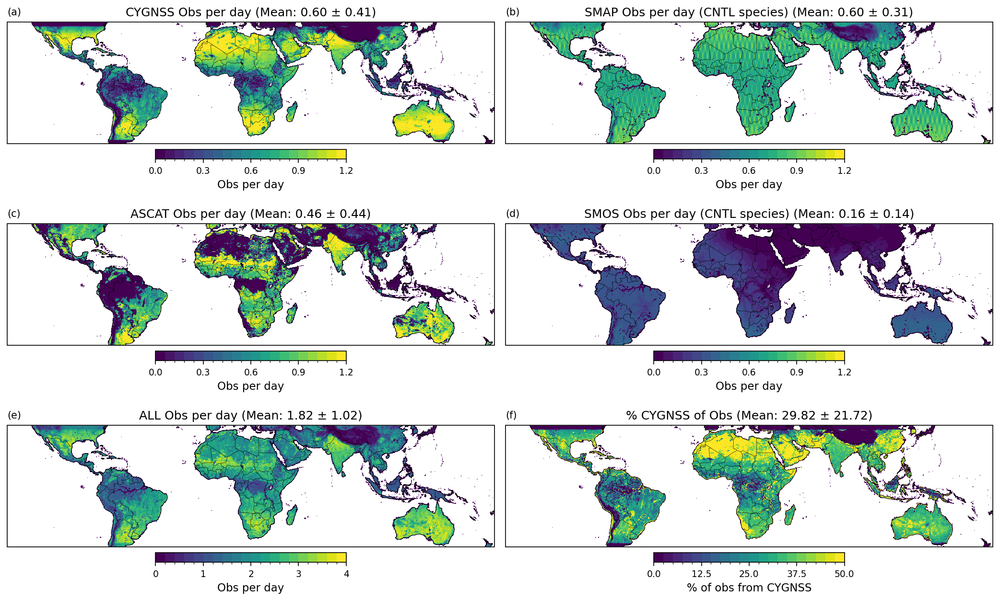

In [18]:
# 6-panel map: CYGNSS, SMAP, ASCAT, SMOS, ALL, %CYGNSS (Obs/day)
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from matplotlib.colors import BoundaryNorm
from matplotlib.cm import get_cmap

ndays = 2161
# Initialize map_array with proper shape (n_tile, 3) where columns are: data, lon, lat
map_array = np.empty([n_tile, 3])
map_array.fill(np.nan)
map_array[:, 1] = lon
map_array[:, 2] = lat

def compute_per_day(group_metrics, group_name):
    raw = group_metrics[group_name]['Nobs_data']
    return np.nan_to_num(raw / ndays, nan=0.0, posinf=0.0, neginf=0.0)

# Per-day counts per group
per_day_maps = {g: compute_per_day(group_metrics_DA, g) for g in species_order_obs}
# Totals and cygnss fraction
total_obs_per_day = sum(per_day_maps.values())
cygnss_obs_per_day = per_day_maps.get('CYGNSS', np.zeros_like(total_obs_per_day))
frac_cygnss = np.divide(cygnss_obs_per_day, total_obs_per_day, out=np.zeros_like(total_obs_per_day), where=total_obs_per_day>0)
percent_cygnss = 100.0 * frac_cygnss

# Helper to plot on given ax
lats, lons = load_ease_grid(ease_path=DATA_DIR)
lats_row, lons_col = lats[:,1], lons[1,:]
lon_grid, lat_grid = np.meshgrid(lons_col, lats_row)

panel_defs = [
    ('CYGNSS', per_day_maps['CYGNSS'], 'CYGNSS Obs per day', (0, 1.2), '(a)'),
    ('SMAP_cnt',   per_day_maps['SMAP_cnt'],   'SMAP Obs per day (CNTL species)',   (0, 1.2), '(b)'),
    ('ASCAT',  per_day_maps['ASCAT'],  'ASCAT Obs per day',  (0, 1.2), '(c)'),
    ('SMOS_cnt',   per_day_maps['SMOS_cnt'],   'SMOS Obs per day (CNTL species)',   (0, 1.2), '(d)'),
    ('ALL',    total_obs_per_day,      'ALL Obs per day', (0, 4.0), '(e)'),
    ('%CYGNSS',percent_cygnss,         '% CYGNSS of Obs', (0, 50.0), '(f)'),
]

fig, axes = plt.subplots(3, 2, figsize=(14, 9), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
for ax, (name, data_1d, title, clim, lab) in zip(axes, panel_defs):
    map_array[:,0] = data_1d
    grid = build_ease_grid_mapping(map_array, lats_row, lons_col)
    
    # Create custom colormap with 20 discrete colors
    edges = np.linspace(clim[0], clim[1], 21)  # 21 edges for 20 intervals
    cmap = get_cmap('viridis', len(edges)-1)
    norm = BoundaryNorm(edges, cmap.N)
    
    sc = ax.pcolormesh(lon_grid, lat_grid, grid, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
    
    maxval = np.nanmax(data_1d)
    minval = np.nanmin(data_1d)
    meanval = np.nanmean(data_1d)
    stdval = np.nanstd(data_1d)
    ax.set_title(f"{title} (Mean: {meanval:.2f} ± {stdval:.2f})")
    ax.text(0.0, 1.04, lab, transform=ax.transAxes, va='bottom', ha='left')
    
    cbar = plt.colorbar(sc, ax=ax, orientation='horizontal', pad=0.03, fraction=0.05)
    units = 'Obs per day' if name != '%CYGNSS' else '% of obs from CYGNSS'
    cbar.set_label(units)
    
    # Set 5 tick labels evenly spaced across the range
    tick_positions = np.linspace(clim[0], clim[1], 5)
    cbar.set_ticks(tick_positions)
plt.tight_layout()
save_fig(plt.gcf(), "figure_1")
plt.show()

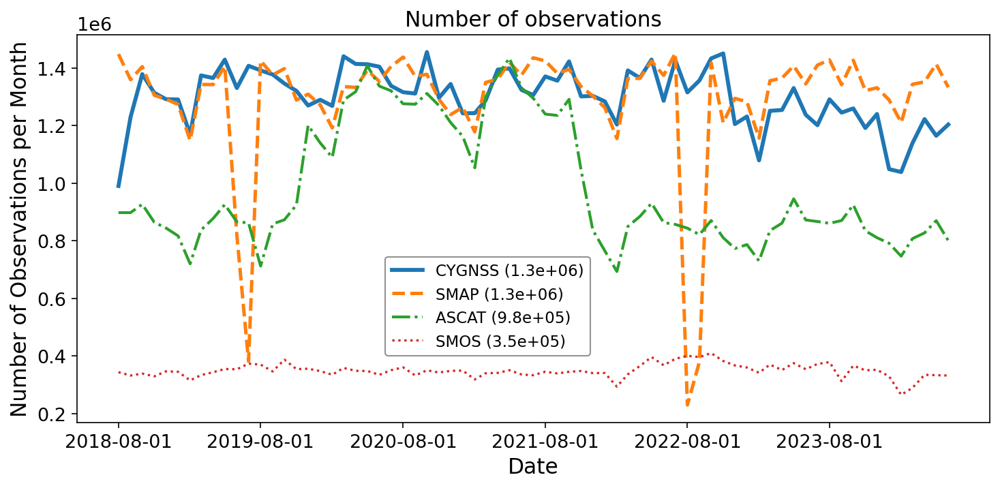

In [19]:
# Replace zeros with NaNs in the data
for group in species_order_obs:
    group_ts_DA_obs[group]['N_data'] = np.where(group_ts_DA_obs[group]['N_data'] == 0, np.nan, group_ts_DA_obs[group]['N_data'])

with mpl.rc_context({"font.size": 14, "legend.fontsize": 11, "axes.titlesize": 15, "axes.labelsize": 15, "xtick.labelsize": 13, "ytick.labelsize": 13}):

    # Plot time series of the number of observations for each group
    plt.figure(figsize=(10, 5))

    # Style cycle (vary line style/width/marker to improve accessibility)
    line_styles = ['-', '--', '-.', ':']
    line_widths = [2.8, 2.4, 2.0, 1.6]

    # Plot Nobs_data for DA for all groups on one figure
    for i, group in enumerate(species_order_obs):
        mean_val = np.nanmean(group_ts_DA_obs[group]['N_data'])
        label = group.replace('_cnt', '')
        plt.plot(
            date_vec_DA,
            group_ts_DA_obs[group]['N_data'],
            label=f'{label} ({mean_val:.1e})',
            linestyle=line_styles[i % len(line_styles)],
            linewidth=line_widths[i % len(line_widths)],
        )

    # Customize plot
    plt.title('Number of observations')
    plt.xlabel('Date')
    plt.ylabel('Number of Observations per Month')
    plt.legend(loc='center', bbox_to_anchor=(0.45, 0.3), frameon=True, facecolor='white', edgecolor='gray', framealpha=0.85)

    # Set x-ticks using datetime array
    plt.xticks(date_vec_DA[::12])

    plt.tight_layout()
    save_fig(plt.gcf(), "figure_S1")
    plt.show()

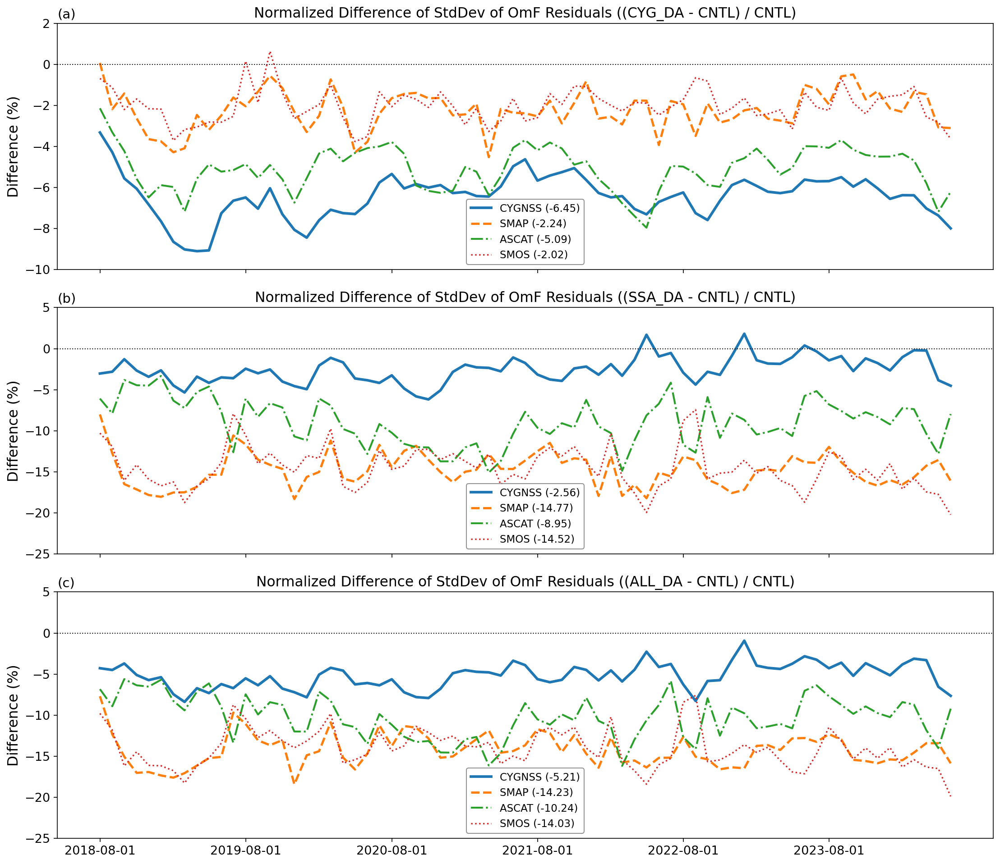

In [20]:
# Combined normalized percent difference for CYG_DA, SSA_DA, ALL_DA
with mpl.rc_context({"font.size": 14, "legend.fontsize": 11, "axes.titlesize": 15, "axes.labelsize": 15, "xtick.labelsize": 13, "ytick.labelsize": 13}):
    fig, axes = plt.subplots(3, 1, figsize=(15, 13), sharex=True)
    labels = ["(a)", "(b)", "(c)"]
    panels = [
        (group_ts_DA, date_vec_DA, "Normalized Difference of StdDev of OmF Residuals ((CYG_DA - CNTL) / CNTL)", (-10, 2)),
        (group_ts_DA_ssa, date_vec_DA_ssa, "Normalized Difference of StdDev of OmF Residuals ((SSA_DA - CNTL) / CNTL)", (-25, 5)),
        (group_ts_DA_all, date_vec_DA, "Normalized Difference of StdDev of OmF Residuals ((ALL_DA - CNTL) / CNTL)", (-25, 5)),
    ]

    # Style cycle (vary line style/width/marker to improve accessibility)
    line_styles = ['-', '--', '-.', ':']
    line_widths = [2.8, 2.4, 2.0, 1.6]

    groups_to_plot = species_order_metrics

    for i, (ax, (ts_dict, dates, title, ylim), lab) in enumerate(zip(axes, panels, labels)):
        for group in groups_to_plot:
            norm_percent_diff = np.divide(
                (ts_dict[group]['OmF_stdv'] - group_ts_OL[group]['OmF_stdv']),
                group_ts_OL[group]['OmF_stdv'],
                out=np.full_like(group_ts_OL[group]['OmF_stdv'], np.nan, dtype=float),
                where=group_ts_OL[group]['OmF_stdv'] != 0
            ) * 100
            mean_diff = np.nanmean(norm_percent_diff)
            ax.plot(dates,
                    norm_percent_diff,
                    linestyle=line_styles[groups_to_plot.index(group) % len(line_styles)],
                    linewidth=line_widths[groups_to_plot.index(group) % len(line_widths)],
                    label=f'{group} ({mean_diff:.2f})')
        
        ax.set_title(title)
        ax.set_ylabel('Difference (%)')
        ax.axhline(y=0, color='black', linestyle=':', linewidth=1)
        ax.set_ylim(*ylim)
        ax.text(0.0, 1.06, lab, transform=ax.transAxes, va='top', ha='left')
        ax.legend(frameon=True, facecolor='white', edgecolor='gray', framealpha=0.85)  # Add legend to each subplot
        
        # Only show x-axis labels and ticks on the bottom plot
        if i < 2:  # Top two plots
            ax.tick_params(axis='x', labelbottom=False)
        else:  # Bottom plot
            # ax.set_xlabel('Date')
            ax.set_xticks(dates[::12])
            ax.set_xticklabels([d.strftime('%Y-%m-%d') for d in dates[::12]])
            ax.tick_params(axis='x')

    plt.tight_layout()
    save_fig(plt.gcf(), "figure_2")
    plt.show()

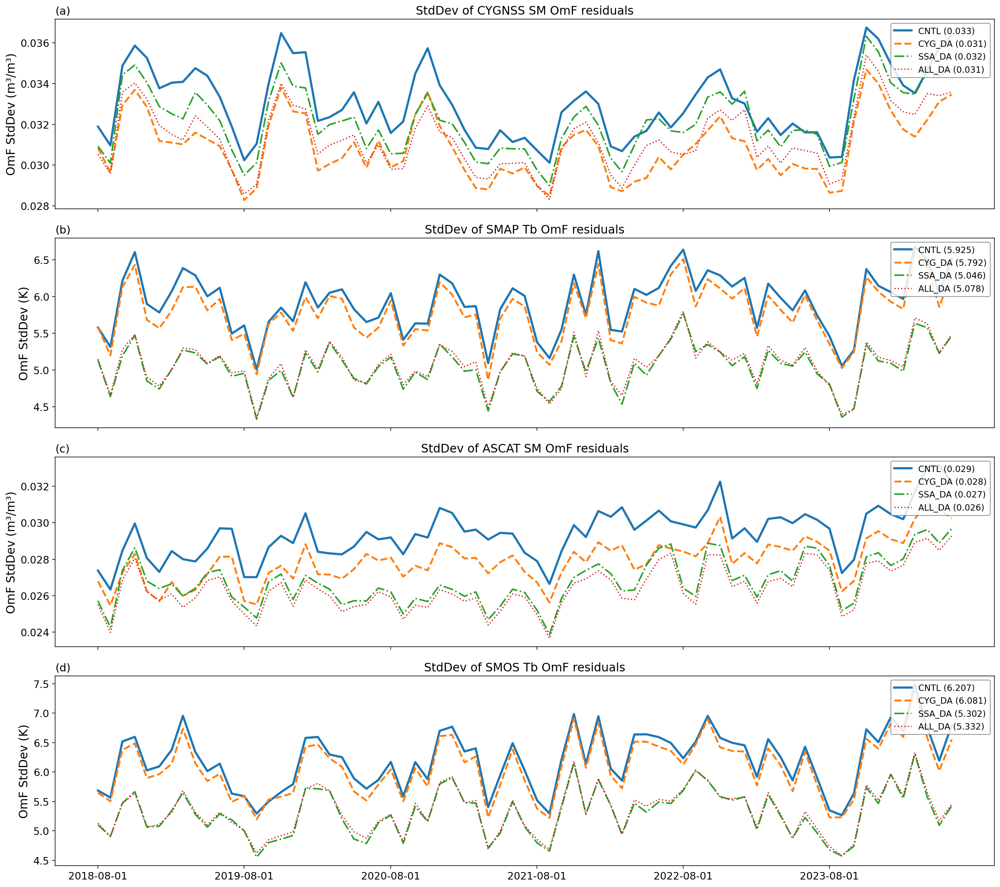

In [21]:
with mpl.rc_context({"font.size": 14, "legend.fontsize": 11, "axes.titlesize": 15, "axes.labelsize": 15, "xtick.labelsize": 13, "ytick.labelsize": 13}):
    # 4x1 panel: OM-F stddev time series per species
    # Panel order: CYGNSS (a), SMAP (b), ASCAT (c), SMOS (d)
    panel_order = ["CYGNSS", "SMAP", "ASCAT", "SMOS"]
    panel_labels = ["(a)", "(b)", "(c)", "(d)"]

    fig, axes = plt.subplots(4, 1, figsize=(18, 16), sharex=True)

    # Style cycle (match figure_2)
    line_styles = ['-', '--', '-.', ':']
    line_widths = [2.8, 2.4, 2.0, 1.6]

    exp_series = [
        ("CNTL",   date_vec_DA,      group_ts_OL),
        ("CYG_DA", date_vec_DA,      group_ts_DA),
        ("SSA_DA", date_vec_DA_ssa,  group_ts_DA_ssa),
        ("ALL_DA", date_vec_DA_all,  group_ts_DA_all),
    ]

    for ax, species, lab in zip(axes, panel_order, panel_labels):
        for e_idx, (label, dates, ts_dict) in enumerate(exp_series):
            vals = ts_dict[species]['OmF_stdv']
            mean_val = np.nanmean(vals)
            ax.plot(
                dates,
                vals,
                linestyle=line_styles[e_idx % len(line_styles)],
                linewidth=line_widths[e_idx % len(line_widths)],
                label=f'{label} ({mean_val:.3f})'
            )

        # Set title and ylabel with appropriate variable type and units based on species
        if species in ["CYGNSS", "ASCAT"]:
            ax.set_title(f'StdDev of {species} SM OmF residuals')
            ax.set_ylabel('OmF StdDev (m³/m³)')
        else:  # SMAP, SMOS
            ax.set_title(f'StdDev of {species} Tb OmF residuals')
            ax.set_ylabel('OmF StdDev (K)')
        ax.text(0.0, 1.07, lab, transform=ax.transAxes, va='top', ha='left')
        ax.legend(loc='upper right', frameon=True, facecolor='white', edgecolor='gray', framealpha=0.85)

    # Only bottom panel gets x labels/ticks
    for i, ax in enumerate(axes):
        if i == 3:  # Only the last panel
            ax.set_xticks(date_vec_DA[::12])
            ax.tick_params(axis='x')
        else:
            ax.tick_params(axis='x', labelbottom=False)

    plt.tight_layout()
    save_fig(plt.gcf(), "figure_S2")
    plt.show()

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/359210788.py:79: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("RdBu_r", len(edges)-1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/359210788.py:86: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=(0, 0.08, 1, 1))
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.

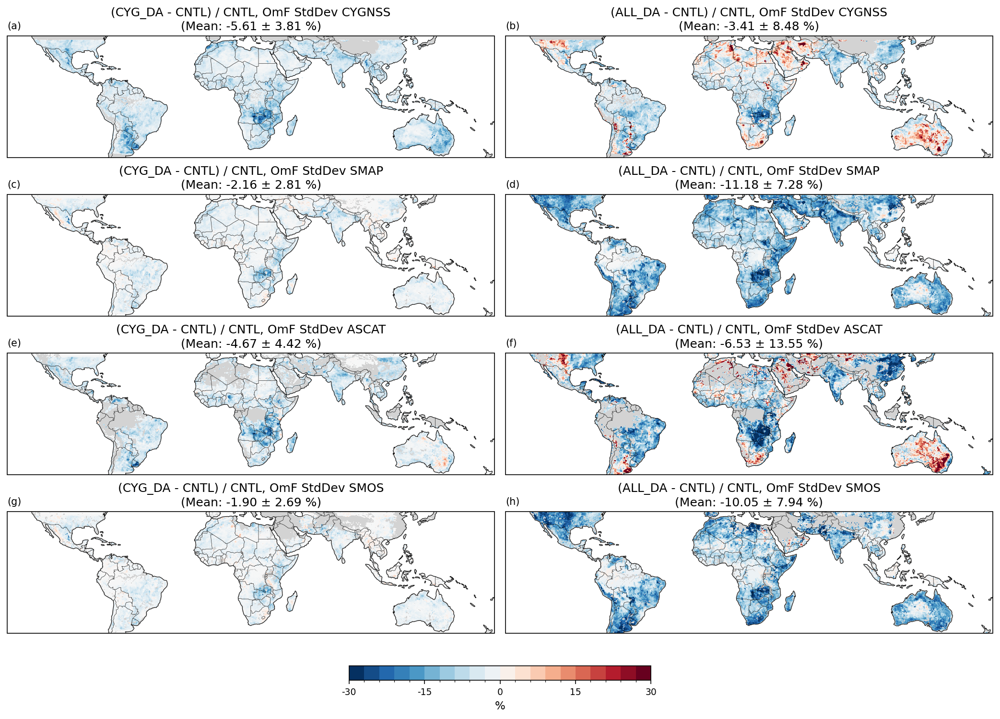

In [22]:
# 8-panel percent-difference maps (DA - CNTL) / CNTL for OmF StdDev

# Helper to compute percent diff safely
def pct_diff(da, ol):
    return np.divide(da - ol, ol, out=np.full_like(ol, np.nan, dtype=float), where=ol != 0) * 100.0

# Prepare per-group percent differences
map_array = np.empty([n_tile, 3])
map_array.fill(np.nan)
map_array[:, 1] = lon
map_array[:, 2] = lat
map_array = map_array.copy()

pct_maps = {
    ('CYGNSS', 'CYG_DA'): pct_diff(group_metrics_DA['CYGNSS']['OmF_stdv'], group_metrics_OL['CYGNSS']['OmF_stdv']),
    ('SMAP',   'CYG_DA'): pct_diff(group_metrics_DA['SMAP']['OmF_stdv'],   group_metrics_OL['SMAP']['OmF_stdv']),
    ('ASCAT',  'CYG_DA'): pct_diff(group_metrics_DA['ASCAT']['OmF_stdv'],  group_metrics_OL['ASCAT']['OmF_stdv']),
    ('SMOS',   'CYG_DA'): pct_diff(group_metrics_DA['SMOS']['OmF_stdv'],   group_metrics_OL['SMOS']['OmF_stdv']),
    ('CYGNSS', 'ALL_DA'): pct_diff(group_metrics_DA_all['CYGNSS']['OmF_stdv'], group_metrics_OL['CYGNSS']['OmF_stdv']),
    ('SMAP',   'ALL_DA'): pct_diff(group_metrics_DA_all['SMAP']['OmF_stdv'],   group_metrics_OL['SMAP']['OmF_stdv']),
    ('ASCAT',  'ALL_DA'): pct_diff(group_metrics_DA_all['ASCAT']['OmF_stdv'],  group_metrics_OL['ASCAT']['OmF_stdv']),
    ('SMOS',   'ALL_DA'): pct_diff(group_metrics_DA_all['SMOS']['OmF_stdv'],   group_metrics_OL['SMOS']['OmF_stdv']),
}

# Panel ordering and labels
# panels = [
#     (('CYGNSS','CYG_DA'), '(a)'),
#     (('SMAP','CYG_DA'), '(b)'),
#     (('ASCAT','CYG_DA'), '(c)'),
#     (('SMOS','CYG_DA'), '(d)'),
#     (('CYGNSS','ALL_DA'), '(e)'),
#     (('SMAP','ALL_DA'), '(f)'),
#     (('ASCAT','ALL_DA'), '(g)'),
#     (('SMOS','ALL_DA'), '(h)'),
# ]

panels = [
    (('CYGNSS','CYG_DA'), '(a)'),
    (('CYGNSS','ALL_DA'), '(b)'),
    (('SMAP','CYG_DA'), '(c)'),
    (('SMAP','ALL_DA'), '(d)'),
    (('ASCAT','CYG_DA'), '(e)'),
    (('ASCAT','ALL_DA'), '(f)'),
    (('SMOS','CYG_DA'), '(g)'),
    (('SMOS','ALL_DA'), '(h)'),
]

# Gather all values to set symmetric color scale
all_vals = np.concatenate([pct_maps[key].flatten() for key,_ in panels])
all_vals = np.concatenate([pct_maps[key].flatten() for key,_ in panels])
vmin, vmax = -30.0, 30.0

lats, lons = load_ease_grid(ease_path=DATA_DIR)
lats_row, lons_col = lats[:,1], lons[1,:]
lon_grid, lat_grid = np.meshgrid(lons_col, lats_row)


fig, axes = plt.subplots(4, 2, figsize=(14, 10), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
for ax, (key, lab) in zip(axes, panels):
    species, exp = key
    data_1d = pct_maps[key]
    mean_val = np.nanmean(data_1d)
    std_val = np.nanstd(data_1d)
    map_array[:,0] = data_1d
    grid = build_ease_grid_mapping(map_array, lats_row, lons_col)
    sc = ax.pcolormesh(lon_grid, lat_grid, grid, cmap='RdBu_r', vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
    ax.set_title(f'({exp} - CNTL) / CNTL, OmF StdDev {species}\n(Mean: {mean_val:.2f} ± {std_val:.2f} %)')
    ax.text(0.0, 1.04, lab, transform=ax.transAxes, va='bottom', ha='left')
    ax.tick_params(labelbottom=False, labelleft=False)

# Shared colorbar at bottom
cax = fig.add_axes([0.35, 0.05, 0.30, 0.02])
edges = np.linspace(vmin, vmax, 21)
cmap = get_cmap("RdBu_r", len(edges)-1)
norm = BoundaryNorm(edges, cmap.N)
sc.set_cmap(cmap); sc.set_norm(norm)
cbar = fig.colorbar(sc, cax=cax, orientation="horizontal")
cbar.set_ticks([-30, -15, 0, 15, 30])
cbar.ax.set_xticklabels(["-30", "-15", "0", "15", "30"])
cbar.set_label('%')
fig.tight_layout(rect=(0, 0.08, 1, 1))
save_fig(plt.gcf(), "figure_3")
plt.show()

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/2433480090.py:46: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap("RdBu_r", len(edges)-1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/2433480090.py:53: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  fig.tight_layout(rect=(0, 0.05, 1, 0.98))
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries

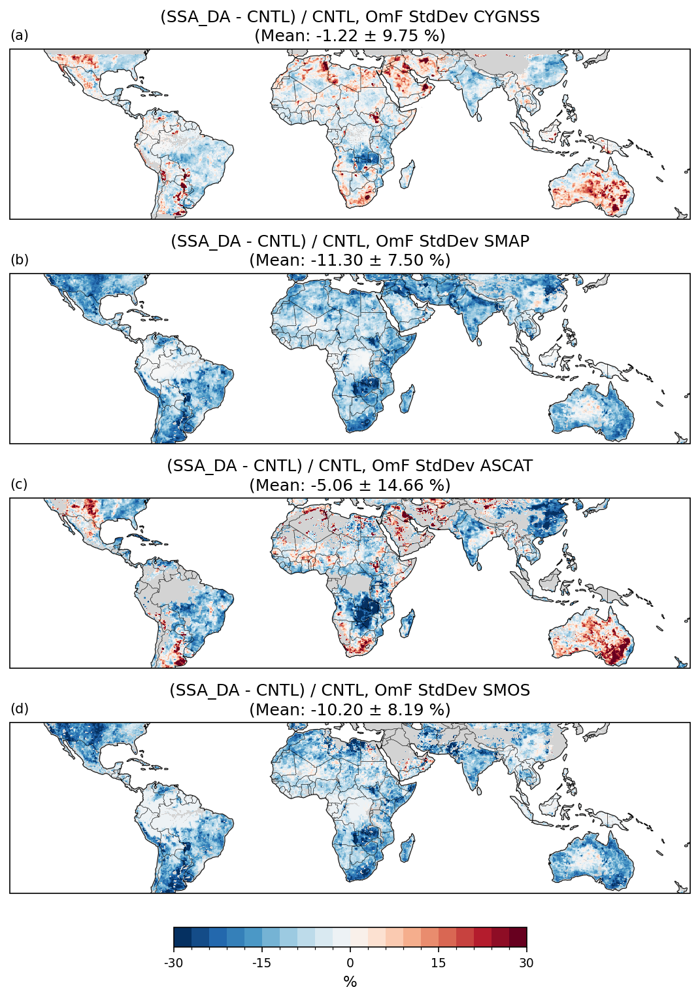

In [23]:
# 4-panel percent-difference maps for SSA_DA vs CNTL (OmF StdDev)

# Helper
map_array = np.empty([n_tile, 3]); map_array.fill(np.nan)
map_array[:,1] = lon; map_array[:,2] = lat
map_array = map_array.copy()

pct_maps_ssa = {
    'CYGNSS': pct_diff(group_metrics_DA_ssa['CYGNSS']['OmF_stdv'], group_metrics_OL['CYGNSS']['OmF_stdv']),
    'SMAP':   pct_diff(group_metrics_DA_ssa['SMAP']['OmF_stdv'],   group_metrics_OL['SMAP']['OmF_stdv']),
    'ASCAT':  pct_diff(group_metrics_DA_ssa['ASCAT']['OmF_stdv'],  group_metrics_OL['ASCAT']['OmF_stdv']),
    'SMOS':   pct_diff(group_metrics_DA_ssa['SMOS']['OmF_stdv'],   group_metrics_OL['SMOS']['OmF_stdv']),
}

panels = [
    ('CYGNSS', '(a)'),
    ('SMAP',   '(b)'),
    ('ASCAT',  '(c)'),
    ('SMOS',   '(d)'),
]

vmin, vmax = -30.0, 30.0
lats, lons = load_ease_grid(ease_path=DATA_DIR); lats_row, lons_col = lats[:,1], lons[1,:]
lon_grid, lat_grid = np.meshgrid(lons_col, lats_row)

fig, axes = plt.subplots(4, 1, figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})
axes = axes.flatten()
for ax, (species, lab) in zip(axes, panels):
    data_1d = pct_maps_ssa[species]
    mean_val = np.nanmean(data_1d)
    std_val = np.nanstd(data_1d)
    map_array[:,0] = data_1d
    grid = build_ease_grid_mapping(map_array, lats_row, lons_col)
    sc = ax.pcolormesh(lon_grid, lat_grid, grid, cmap='RdBu_r', vmin=vmin, vmax=vmax, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
    ax.set_title(f'(SSA_DA - CNTL) / CNTL, OmF StdDev {species}\n(Mean: {mean_val:.2f} ± {std_val:.2f} %)')
    ax.text(0.0, 1.04, lab, transform=ax.transAxes, va='bottom', ha='left')
    ax.tick_params(labelbottom=False, labelleft=False)

# Shared colorbar
cax = fig.add_axes([0.35, 0.01, 0.30, 0.02])
edges = np.linspace(vmin, vmax, 21)
cmap = get_cmap("RdBu_r", len(edges)-1)
norm = BoundaryNorm(edges, cmap.N)
sc.set_cmap(cmap); sc.set_norm(norm)
cbar = fig.colorbar(sc, cax=cax, orientation="horizontal")
cbar.set_ticks([-30, -15, 0, 15, 30])
cbar.ax.set_xticklabels(["-30", "-15", "0", "15", "30"])
cbar.set_label('%')
fig.tight_layout(rect=(0, 0.05, 1, 0.98))
save_fig(plt.gcf(), "figure_S3")
plt.show()

## In-Situ Network Summary (Figures S4, 4, 5)
Loads in-situ network statistics once and builds overlay plots for raw means, deltas, and multi-network maps.

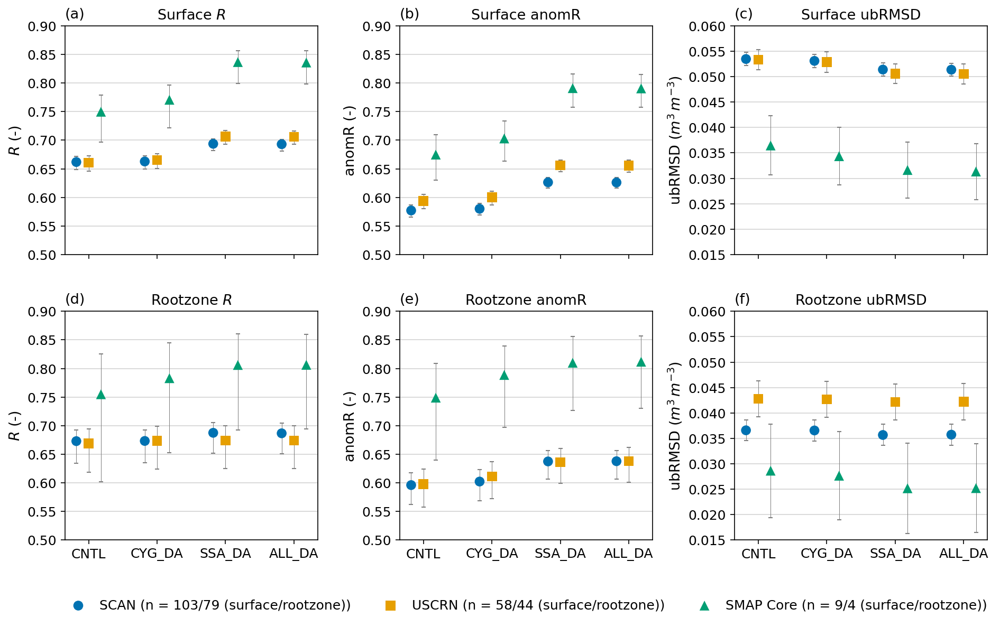

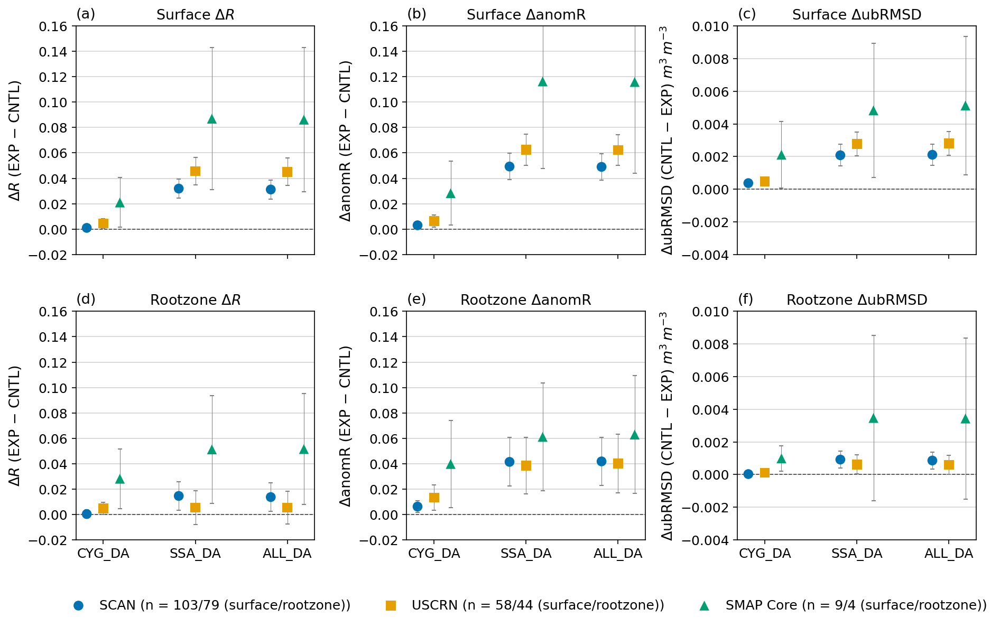

In [24]:
import scipy.io as sio
from scipy.stats import t

# ===============================
# CONFIG
# ===============================


BASE_DIR = DATA_DIR

# Experiments (order -> x-axis)
# experiment_names = ["CNTL", "CYG_DA", "SSA_DA", "ALL_DA"]
# expt_labels = ["CNTL", "CYG_DA", "SSA_DA", "ALL_DA"]

experiment_names = ["CNTL", "CYG_DA", "SSA_DA", "ALL_DA"]
expt_labels = ["CNTL", "CYG_DA", "SSA_DA", "ALL_DA"] 

# Networks to combine: (insitu_tag_in_filename, label)
networks = [
    ("_SCAN_SM_1d_c1234smv_6yr", "SCAN"),
    ("_USCRN_SM_1d_c1234smv_6yr", "USCRN"),
    ("_CalVal_M33_SM_1d__6yr", "SMAP Core"),
]

# Plot look
dot_size = 80
capsize = 2

# Okabe–Ito palette (3 distinct)
palette = {"SCAN": "#0072B2", "USCRN": "#E69F00", "SMAP Core": "#009E73"}
markers = {"SCAN": "o", "USCRN": "s", "SMAP Core": "^"}

# Panels and y-lims for raw means
panel_info_means = [
    ("R",      r"$R$ (-)",                (0.50, 0.90)),
    ("anomR",  r"anomR (-)",              (0.50, 0.90)),
    ("ubRMSE", r"ubRMSD ($m^3\,m^{-3}$)", (0.015, 0.060)),
]

# Panels and y-lims for deltas (tweak if needed)
panel_info_delta = [
    ("R",      r"Δ$R$ (EXP − CNTL)",                      (-0.02, 0.16)),
    ("anomR",  r"ΔanomR (EXP − CNTL)",                    (-0.02, 0.16)),
    ("ubRMSE", r"ΔubRMSD (CNTL − EXP) $m^3\,m^{-3}$",     (-0.004, 0.010)),
]

# ===============================
# HELPERS
# ===============================
def reduce_metric_means_ci(arr, lo, up):
    """
    Compute mean across sites and CI magnitudes as in your original script:
    CI_magnitudes ≈ mean(LO or UP)/sqrt(N_nonNaN).
    Returns:
      mean: (depth,)
      ci_mag: (2, depth)  (lower, upper) magnitudes (non-negative)
      n: (depth,) integer counts of non-NaN sites
    """
    mean = np.nanmean(arr, axis=0)                  # (depth,)
    n = np.sum(~np.isnan(arr), axis=0)              # (depth,)
    denom = np.sqrt(np.maximum(n, 1))
    ci_lo = np.nanmean(lo, axis=0) / denom
    ci_up = np.nanmean(up, axis=0) / denom
    ci_mag = np.vstack([np.abs(ci_lo), np.abs(ci_up)])
    return mean, ci_mag, n

# For metrics where lower is better (e.g., ubRMSE), use up_is_better=False to make CNTL-EXP positive.
def paired_delta_stats(arr_cntl, arr_exp, up_is_better=True, alpha=0.05):
    """
    Paired per-site differences and t-intervals (statistically correct).
    arr_cntl, arr_exp: (sites, depth)
    up_is_better=True -> Δ = EXP - CNTL; False -> Δ = CNTL - EXP (e.g., ubRMSE)
    Returns:
      mean_delta: (depth,)
      ci_half:   (depth,) symmetric t CI half-width (magnitude)
      n_eff:     (depth,) paired counts
    """
    sign = +1 if up_is_better else -1
    D = sign * (arr_exp - arr_cntl)                 # (sites, depth)
    # mask to paired non-NaN per depth
    mask = (~np.isnan(arr_cntl)) & (~np.isnan(arr_exp))
    depth = arr_cntl.shape[1]
    mean_delta = np.full(depth, np.nan)
    ci_half = np.full(depth, 0.0)
    n_eff = np.zeros(depth, dtype=int)

    for d in range(depth):
        m = mask[:, d]
        if not np.any(m):
            continue
        di = D[m, d]
        n = di.size
        n_eff[d] = n
        dbar = np.nanmean(di)
        sd = np.nanstd(di, ddof=1) if n > 1 else 0.0
        se = sd / np.sqrt(max(n, 1))
        k = t.ppf(1 - alpha/2, df=max(n-1, 1))
        mean_delta[d] = dbar
        ci_half[d] = k * se
    return mean_delta, ci_half, n_eff

def plot_overlay(
    means_dict, cis_dict, Ns_dict, panel_info, outfile,
    title_suffix="", expt_idx=None, x_tick_labels=None, font_sizes=None
): 
    num_networks = len(networks)
    all_idx = np.arange(len(expt_labels))
    if expt_idx is None:
        expt_idx = all_idx
    expt_idx = np.asarray(expt_idx)
    if x_tick_labels is None:
        x_tick_labels = [expt_labels[i] for i in expt_idx]

    if font_sizes is None:
        font_sizes = {
            "font.size": 12,
            "legend.fontsize": 11,
            "axes.titlesize": 12,
            "axes.labelsize": 12,
            "xtick.labelsize": 11,
            "ytick.labelsize": 11,
        }

    with mpl.rc_context(font_sizes):
        fig = plt.figure(figsize=(12.5, 7.8), constrained_layout=True)
        mosaic = [
            ["s0", "s1", "s2"],
            ["r0", "r1", "r2"],
            ["legend", "legend", "legend"],
        ]
        axs = fig.subplot_mosaic(
                mosaic,
                gridspec_kw={"height_ratios": [1.0, 1.0, 0.12], "hspace": 0.15}
                )

        # Add panel labels
        labels = ["(a)", "(b)", "(c)", "(d)", "(e)", "(f)"]
        label_keys = ["s0", "s1", "s2", "r0", "r1", "r2"]
        for lab, key in zip(labels, label_keys):
            axs[key].text(0.0, 1.02, lab, transform=axs[key].transAxes,
                          va="bottom", ha="left", clip_on=False)
        ax_leg = axs["legend"]; ax_leg.axis("off")

        x = np.arange(len(expt_idx))
        offsets = np.linspace(-0.18, 0.18, num_networks)
        # Legend labels with counts from CNTL (surface/rootzone)
        count_key = "R" if "R" in Ns_dict else panel_info[0][0]
        legend_labels = []
        for ni in range(num_networks):
            n_surf = int(Ns_dict[count_key][ni, 0, 0])
            n_root = int(Ns_dict[count_key][ni, 1, 0])
            legend_labels.append(f"{networks[ni][1]} (n = {n_surf}/{n_root} (surface/rootzone))")

        for col, (metric_key, ylab, ylim) in enumerate(panel_info):
            for depth in [0, 1]:
                ax = axs[("s" if depth == 0 else "r") + str(col)]
                ax.grid(axis="y", color="lightgrey", zorder=0)
                ax.axhline(y=0, color='black', linestyle='--', linewidth=0.8, alpha=0.7, zorder=1)
                ax.set_axisbelow(True)

                for ni, (_, nlabel) in enumerate(networks):
                    y  = means_dict[metric_key][ni, depth, expt_idx]
                    xpos = x + offsets[ni]

                    ci = np.asarray(cis_dict[metric_key][ni, :, depth, expt_idx], dtype=float)
                    if ci.ndim == 0:                    # scalar -> (2,1)
                        val = float(ci)
                        ci = np.array([[val], [val]])
                    elif ci.ndim == 1:                  # (N,) -> (2,N) symmetric
                        ci = np.vstack([ci, ci])
                    elif ci.ndim == 2 and ci.shape[0] != 2:  # (N,2) -> (2,N)
                        ci = ci.T

                    ax.scatter(xpos, y, s=dot_size, marker=markers[nlabel],
                               color=palette[nlabel], edgecolor="none", zorder=3,
                               label=legend_labels[ni] if (depth==0 and col==0) else None)
                    ax.errorbar(xpos, y, yerr=ci, fmt="none", ecolor="gray",
                                elinewidth=0.5, capsize=capsize, zorder=2)

                ax.set_ylim(*ylim)
                if depth == 1:
                    ax.set_xticks(x, x_tick_labels)
                else:
                    ax.set_xticks(x, [""] * len(x_tick_labels))

                ax.set_ylabel(ylab)
                layer = "Surface" if depth == 0 else "Rootzone"
                ylab_title = ylab.split(" (")[0]
                ax.set_title(f"{layer} {ylab_title}")

        # Legend centered in slim band
        handles, labels = axs["s0"].get_legend_handles_labels()
        if handles:
            ax_leg.legend(handles, labels, loc="center", ncols=len(labels), frameon=False,
                          handletextpad=0.6, borderaxespad=0.0)

        save_fig(fig, name=Path(outfile).stem if outfile else None)
        #plt.close(fig)
# ===============================
# LOAD ALL FILES ONCE; BUILD STATS
# ===============================
metrics = ["R", "anomR", "ubRMSE"]
num_expts = len(experiment_names)
num_networks = len(networks)

# Store per-network, per-experiment, per-metric arrays for paired Δ (site x depth)
store_R     = [[None]*num_expts for _ in range(num_networks)]
store_anomR = [[None]*num_expts for _ in range(num_networks)]
store_ub    = [[None]*num_expts for _ in range(num_networks)]

# Containers for RAW means/CI/N
means_raw = {m: np.full((num_networks, 2, num_expts), np.nan) for m in metrics}
cis_raw   = {m: np.full((num_networks, 2, 2, num_expts), np.nan) for m in metrics}  # (net, lo/up, depth, expt)
Ns_raw    = {m: np.zeros((num_networks, 2, num_expts), dtype=int) for m in metrics}

for ni, (tag, nlabel) in enumerate(networks):
    for ei, exname in enumerate(experiment_names):
        fpath = BASE_DIR / f"{exname}{tag}_stats_60.mat"
        mat = sio.loadmat(fpath, squeeze_me=False)

        # Arrays (sites x depth)
        R       = np.asarray(mat["R"])
        RLO     = np.asarray(mat["RLO"])
        RUP     = np.asarray(mat["RUP"])
        anomR   = np.asarray(mat["anomR"])
        anomRLO = np.asarray(mat["anomRLO"])
        anomRUP = np.asarray(mat["anomRUP"])
        ub      = np.asarray(mat["ubRMSE"])
        ubLO    = np.asarray(mat["ubRMSELO"])
        ubUP    = np.asarray(mat["ubRMSEUP"])

        # Save for paired Δ later
        store_R[ni][ei]     = R
        store_anomR[ni][ei] = anomR
        store_ub[ni][ei]    = ub

        # Raw means & CI magnitudes (following your earlier approach)
        for key, arrs in {
            "R":      (R, RLO, RUP),
            "anomR":  (anomR, anomRLO, anomRUP),
            "ubRMSE": (ub, ubLO, ubUP),
        }.items():
            m, ci2, n = reduce_metric_means_ci(*arrs)
            means_raw[key][ni, :, ei] = m
            cis_raw[key][ni, :, :, ei] = ci2
            Ns_raw[key][ni, :, ei] = n

# ===============================
# FIGURE 1: RAW MEANS (overlay)
# ===============================
font_sizes_overlay = {
    "font.size": 13,
    "legend.fontsize": 12,
    "axes.titlesize": 13,
    "axes.labelsize": 13,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
}

plot_overlay(means_raw, cis_raw, Ns_raw, panel_info_means,
             Path(SAVE_DIR)/"figure_S4", title_suffix="", font_sizes=font_sizes_overlay)

# ===============================
# FIGURE 2: Δ FROM CONTROL (overlay, paired per-site t CIs)
# ===============================
# Build Δ vs CNTL for each network/experiment using site-paired differences.
delta_means = {m: np.full_like(means_raw[m], np.nan) for m in metrics}  # NaN instead of zeros
delta_cis   = {m: np.full_like(cis_raw[m], np.nan)   for m in metrics}  # NaN instead of zeros
Ns_delta    = {m: np.zeros_like(Ns_raw[m])    for m in metrics}         # Keep zeros for counts

for ni in range(num_networks):
    # reference CNTL (ei=0)
    R_cntl     = store_R[ni][0]
    anomR_cntl = store_anomR[ni][0]
    ub_cntl    = store_ub[ni][0]

    # Set Δ at CNTL = 0 with 0 CI
    for key in metrics:
        delta_means[key][ni, :, 0] = 0.0
        delta_cis[key][ni, :, :, 0] = 0.0
        Ns_delta[key][ni, :, 0] = np.sum(~np.isnan(store_R[ni][0]), axis=0)  # any metric; counts of CNTL available

    # Other experiments (ei >= 1)
    for ei in range(1, num_expts):
        # R and anomR: Δ = EXP - CNTL (up is better)
        md, hw, n = paired_delta_stats(R_cntl, store_R[ni][ei], up_is_better=True)
        delta_means["R"][ni, :, ei] = md
        delta_cis["R"][ni, 0, :, ei] = hw  # lower mag
        delta_cis["R"][ni, 1, :, ei] = hw  # upper mag
        Ns_delta["R"][ni, :, ei] = n

        md, hw, n = paired_delta_stats(anomR_cntl, store_anomR[ni][ei], up_is_better=True)
        delta_means["anomR"][ni, :, ei] = md
        delta_cis["anomR"][ni, 0, :, ei] = hw
        delta_cis["anomR"][ni, 1, :, ei] = hw
        Ns_delta["anomR"][ni, :, ei] = n

        # ubRMSE: improvement = CNTL - EXP (up is better)
        md, hw, n = paired_delta_stats(ub_cntl, store_ub[ni][ei], up_is_better=False)
        delta_means["ubRMSE"][ni, :, ei] = md
        delta_cis["ubRMSE"][ni, 0, :, ei] = hw
        delta_cis["ubRMSE"][ni, 1, :, ei] = hw
        Ns_delta["ubRMSE"][ni, :, ei] = n

# Plot Δ overlay
plot_overlay(
    delta_means, delta_cis, Ns_delta, panel_info_delta,
    Path(SAVE_DIR)/"figure_4",
    title_suffix="Δ from CNTL",
    expt_idx=[1,2,3],                         # <- drop CNTL
    x_tick_labels=[expt_labels[i] for i in [1,2,3]],
    font_sizes=font_sizes_overlay
)

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/3634569804.py:28: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmaps = [get_cmap('RdBu_r', len(levels_R)-1),
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/3634569804.py:29: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  get_cmap('RdBu_r', len(levels_anomR)-1),
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/3634569804.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` ins

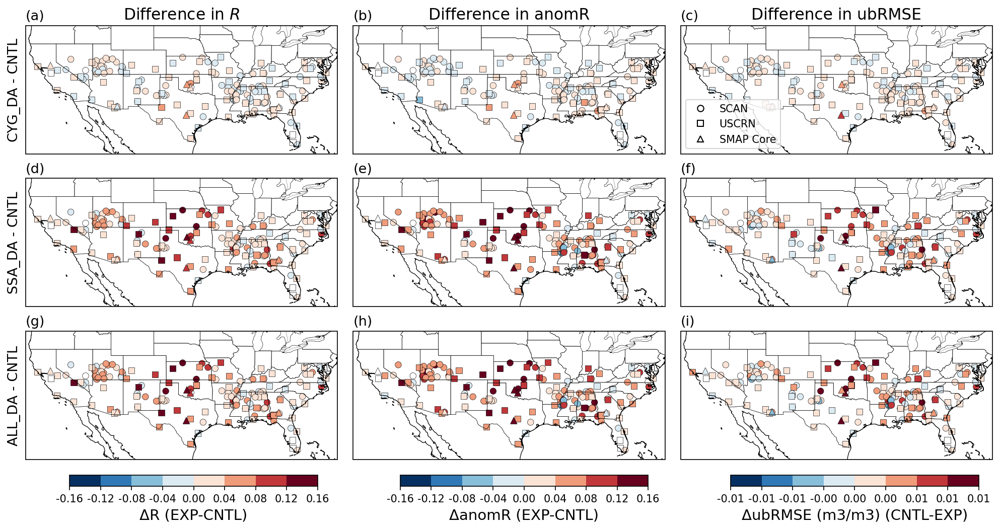

In [25]:
# Combined 3x3 overlay for all networks (SCAN, USCRN, SMAP Core) with SMAP on top

font_sizes_fig5 = {
    "font.size": 13,
    "legend.fontsize": 10,
    "axes.titlesize": 15,
    "axes.labelsize": 14,
    "xtick.labelsize": 12,
    "ytick.labelsize": 12,
}

with mpl.rc_context(font_sizes_fig5):
    
    # Build overlay order using existing networks (use 6yr tags), SMAP drawn last
    order_labels = ['SCAN', 'USCRN', 'SMAP Core']
    markers = {'SCAN': ('o', 36), 'USCRN': ('s', 34), 'SMAP Core': ('^', 42)}
    overlay_networks = []
    for lbl in order_labels:
        for tag, nlabel in networks:
            if nlabel == lbl:
                marker, size = markers.get(lbl, ('o', 36))
                overlay_networks.append((tag, nlabel, marker, size))
                break
    
    levels_R = np.linspace(-0.16, 0.16, 9)
    levels_anomR = np.linspace(-0.16, 0.16, 9)
    levels_ub = np.linspace(-0.012, 0.012, 9)
    cmaps = [get_cmap('RdBu_r', len(levels_R)-1),
             get_cmap('RdBu_r', len(levels_anomR)-1),
             get_cmap('RdBu_r',   len(levels_ub)-1)]
    levels_list = [levels_R, levels_anomR, levels_ub]
    titles_col = ['ΔR (EXP-CNTL)', 'ΔanomR (EXP-CNTL)', 'ΔubRMSE (m3/m3) (CNTL-EXP)']
    labels = ['(a)', '(b)', '(c)', '(d)', '(e)', '(f)', '(g)', '(h)', '(i)']
    rows = [
        ('CYG_DA - CNTL', 1),
        ('SSA_DA - CNTL', 2),
        ('ALL_DA - CNTL', 3),
    ]
    
    # Determine control prefix
    if 'experiment_names' in globals():
        control_prefix = experiment_names[0]
    elif 'experiments' in globals():
        control_prefix = experiments[0]['prefix']
    else:
        raise NameError('experiment_names/experiments not defined; run setup cells first')
    
    # Precompute arrays and lat/lon per network
    overlay_data = {}
    for tag, nlabel, _, _ in overlay_networks:
        try:
            nidx = next(i for i, (t, _) in enumerate(networks) if t == tag)
        except StopIteration:
            raise ValueError(f'Network tag {tag} not found in networks={networks}')
        overlay_data[tag] = {
            'R': np.stack(store_R[nidx], axis=-1),
            'anomR': np.stack(store_anomR[nidx], axis=-1),
            'ubRMSE': np.stack(store_ub[nidx], axis=-1),
        }
        raw_path = BASE_DIR / f"{control_prefix}{tag}_raw_timeseries.mat"
        mat_raw = sio.loadmat(raw_path, squeeze_me=False)
        overlay_data[tag]['lat'] = mat_raw['INSITU_lat'].flatten()
        overlay_data[tag]['lon'] = mat_raw['INSITU_lon'].flatten()
    
    fig, axes = plt.subplots(3, 3, figsize=(16, 8), subplot_kw={'projection': ccrs.PlateCarree()})
    axes = axes.reshape(3, 3)
    lab_idx = 0
    legend_handles = None
    legend_labels = None
    for r_idx, (row_title, exp_idx) in enumerate(rows):
        for c_idx, (metric, levels, cmap) in enumerate(zip(['R', 'anomR', 'ubRMSE'], levels_list, cmaps)):
            ax = axes[r_idx, c_idx]
            norm = BoundaryNorm(levels, cmap.N)
            for tag, nlabel, marker, size in overlay_networks:
                arr = overlay_data[tag][metric]
                if metric == 'ubRMSE':
                    data = arr[:, 0, 0] - arr[:, 0, exp_idx]
                else:
                    data = arr[:, 0, exp_idx] - arr[:, 0, 0]
                lat = overlay_data[tag]['lat']; lon = overlay_data[tag]['lon']
                sc = ax.scatter(lon, lat, c=data, cmap=cmap, norm=norm, s=size,
                                marker=marker, edgecolor='k', linewidths=0.3,
                                transform=ccrs.PlateCarree(), label=nlabel)
            ax.add_feature(cfeature.COASTLINE, linewidth=0.6)
            ax.add_feature(cfeature.BORDERS, linewidth=0.4, linestyle=':')
            ax.add_feature(cfeature.STATES, linewidth=0.3)
            ax.set_extent([-125, -74, 24, 45], crs=ccrs.PlateCarree())
            if r_idx == 0:
                col_titles = [r'Difference in $R$', 'Difference in anomR', 'Difference in ubRMSE']
                ax.set_title(col_titles[c_idx])
            else:
                ax.set_title('')
            ax.tick_params(labelbottom=False, labelleft=False)
            ax.text(0.0, 1.02, labels[lab_idx], transform=ax.transAxes, va='bottom', ha='left')
            if legend_handles is None:
                legend_handles, legend_labels = ax.get_legend_handles_labels()
            lab_idx += 1
    
    # Add a single legend (unfilled markers)
    if legend_labels:
        from matplotlib.lines import Line2D
        legend_handles = [
            Line2D([0], [0], marker=marker, linestyle='None',
                   markerfacecolor='white', markeredgecolor='black',
                   markersize=6, label=nlabel)
            for _, nlabel, marker, _ in overlay_networks
        ]
        axes[0,2].legend(legend_handles, legend_labels, loc='lower left', frameon=True)
    
    # Colorbars under each column
    cbar_h = 0.018
    bottom_row = axes[-1, :]
    y_min = min(ax.get_position().y0 for ax in bottom_row)
    gap = 0.005
    cbar_y = y_min - gap - cbar_h
    for levels, cmap, title, col_ax in zip(levels_list, cmaps, titles_col, axes.T):
        x0 = min(ax.get_position().x0 for ax in col_ax)
        x1 = max(ax.get_position().x1 for ax in col_ax)
        span = x1 - x0
        width = 0.90 * span
        xpos = x0 + 0.5 * (span - width)
        norm = BoundaryNorm(levels, cmap.N)
        sm = plt.cm.ScalarMappable(norm=norm, cmap=cmap)
        cax = fig.add_axes([xpos, cbar_y, width, cbar_h])
        cbar = fig.colorbar(sm, cax=cax, orientation='horizontal')
        cbar.ax.tick_params(labelsize=10) 
        cbar.set_label(title)
        cbar.set_ticks(levels)
        if title.startswith('Difference in ubRMSE'):
            cbar.ax.set_xticklabels([f"{lvl:.3f}" for lvl in levels])
        else:
            cbar.ax.set_xticklabels([f"{lvl:.2f}" for lvl in levels])
    
    plt.subplots_adjust(wspace=0.05, hspace=0.08, bottom=0.14, left=0.10)
    # Row labels on the left margin (after layout adjustments)
    x_label = 0.085
    for r_idx, (row_title, _) in enumerate(rows):
        pos = axes[r_idx, 0].get_position()
        y_center = 0.5 * (pos.y0 + pos.y1)
        fig.text(x_label, y_center, row_title, rotation=90, va="center", ha="left")
    # plt.suptitle('All networks overlay (SMAP Core on top)', y=0.99)
    save_fig(plt.gcf(), "figure_5")
    plt.show()

In [26]:
import pandas as pd
import xarray as xr
from scipy.io import loadmat
from scipy.spatial import cKDTree
from matplotlib.colors import ListedColormap



## TC/Aridity/LAI Analysis (Figures 6, 7, S5, S6)
Loads TC stats, aridity/LAI fields, and vegetation/tile data; builds KDTree mappings; then generates boxplots and maps.

In [27]:
# ------------------------------
# 1) Load TC stats
# ------------------------------

p_cntl = DATA_DIR / 'ASCL4_SMOSIC_OLv8_M36_cd_TC_stats_201808_202405.mat'
p_da   = DATA_DIR / 'ASCL4_SMOSIC_DAv8_M36_cd_TC_stats_201808_202405.mat'

Nmin = 50 # Override Nmin value from mat files

# Load .mat (squeeze to 1D vectors)

def _vec(x):
    return np.asarray(x).squeeze()

M0 = loadmat(p_cntl, squeeze_me=True, struct_as_record=False)
M1 = loadmat(p_da,   squeeze_me=True, struct_as_record=False)

# expected vars: 'lons','lats','N_sm','Nmin','R2_TC_SMOS','R2_TC_ASC','R2_TC_mod',
# 'sigma2_SMOS','sigma2_mod','sigma2_ASC','R_mod_SMOS','R_mod_ASC','R_ASC_SMOS',
# 'C_SMOS_mod','C_mod_ASC','C_SMOS_ASC'

def grab(M, name):
    if name not in M:
        raise KeyError(f"Missing '{name}' in file")
    return _vec(M[name])

# grid shape from lons/lats
lons_tc_grid = grab(M0, 'lons')
lats_tc_grid = grab(M0, 'lats')

if lons_tc_grid.ndim == 2 and lats_tc_grid.ndim == 2:
    shp = lons_tc_grid.shape
else:
    # If saved flat, set to your grid dims and reshape
    nlon, nlat = 406, 964
    shp = (nlon, nlat)
    lons_tc_grid = lons_tc_grid.reshape(shp)
    lats_tc_grid = lats_tc_grid.reshape(shp)

# Helpers to coerce arrays to 2D grid

def as_grid(M, key, shp):
    a = grab(M, key)
    if a.ndim == 2 and a.shape == shp:
        return a
    if a.size == np.prod(shp):
        return a.reshape(shp)
    # Some MATLAB saves may come as (nlat, nlon); handle simple transpose case
    if a.ndim == 2 and a.shape == (shp[1], shp[0]):
        return a.T
    raise ValueError(f"Field '{key}' has unexpected shape {a.shape}, cannot map to {shp}")


def get_fields(M, shp):
    grid_keys = [
        'N_sm',
        'R2_TC_SMOS', 'R2_TC_ASC', 'R2_TC_mod',
        'sigma2_SMOS', 'sigma2_mod', 'sigma2_ASC',
        'R_mod_SMOS', 'R_mod_ASC', 'R_ASC_SMOS',
        'C_SMOS_mod', 'C_mod_ASC', 'C_SMOS_ASC',
    ]
    out = {k: as_grid(M, k, shp) for k in grid_keys}
    out['Nmin'] = float(grab(M, 'Nmin'))
    return out

S0 = get_fields(M0, shp)  # CNTL
S1 = get_fields(M1, shp)  # CYG_DA

In [28]:
# ------------------------------
# 2) Compute metrics
# ------------------------------
# Common-valid mask
if 'Nmin' not in globals():
    Nmin = int(np.nanmax(S0['Nmin']))
    
Mvalid = (
    (S0['N_sm'] >= Nmin) & (S1['N_sm'] >= Nmin) &
    np.isfinite(S0['R2_TC_mod']) & np.isfinite(S1['R2_TC_mod']) &
    np.isfinite(S0['sigma2_mod']) & np.isfinite(S1['sigma2_mod'])
)

# Clamp R2 to (0,1]

def clamp01(a):
    out = a.copy()
    out[(out <= 0) | (~np.isfinite(out))] = np.nan
    out[out > 1] = 1.0
    return out

R2m0 = clamp01(S0['R2_TC_mod'])
R2m1 = clamp01(S1['R2_TC_mod'])

# ΔR2 and %Δsigma2
# (a) change in R² (positive is better)
dR2_mod = np.where(Mvalid, R2m1 - R2m0, np.nan)

# (c) change in model error variance (sigma²_mod) and % change
sig20 = S0['sigma2_mod']
sig21 = S1['sigma2_mod']

# mask tiny baseline sigma2 before % change
p10 = np.nanpercentile(sig20, 10)
baseline_floor = max(1e-8, p10)
good_base = Mvalid & np.isfinite(sig20) & (sig20 > baseline_floor)

pct_sig2 = np.full_like(sig20, np.nan)
pct_sig2[good_base] = 100.0 * (sig21[good_base] / sig20[good_base] - 1.0)

# Flatten for mapping
pct_sig2_vec = np.asarray(pct_sig2.flatten(), dtype=float)
dR2_mod_vec = np.asarray(dR2_mod.flatten(), dtype=float)

In [29]:
# ------------------------------
# 3) Load aridity / LAI climatology
# ------------------------------
fn = DATA_DIR / 'aridity_indices_model_net_rad_20180801_20240630.nc4'
ds = xr.open_dataset(fn, decode_times=True)

ai = ds['AI_clim'].values
lon_ai = ds['lon'].isel(time=1).values
lat_ai = ds['lat'].isel(time=1).values
mean_lai_clim = ds['mean_lai_clim'].values

ai_flat = np.squeeze(ai)
lon_flat_ai = np.squeeze(lon_ai)
lat_flat_ai = np.squeeze(lat_ai)
mean_lai_flat = np.squeeze(mean_lai_clim)

# For AGU25-like behavior, use the aridity/LAI grid for KDTree targets
pred_lon_flat = lon_flat_ai
pred_lat_flat = lat_flat_ai

In [30]:
# ------------------------------
# 4) Build KDTree source points from the SMOS TC grid
# ------------------------------
lons_tc = np.asarray(grab(M0, 'lons')).ravel()
lats_tc = np.asarray(grab(M0, 'lats')).ravel()


# NOTE: KDTree mapping uses the SMOS TC lon/lat grid only.

In [31]:
# ------------------------------
# 5) KDTree mapping (AGU25-like: targets mapped to aridity grid)
# Nearest-neighbor mapping aligns TC points to the aridity/LAI grid for binning/plots.
# ------------------------------
vec_pts = np.column_stack((np.ravel(lons_tc), np.ravel(lats_tc)))
flat_pts = np.column_stack((np.ravel(pred_lon_flat), np.ravel(pred_lat_flat)))

kdtree = cKDTree(vec_pts)
_, idxs = kdtree.query(flat_pts, k=1)

# Map targets to the aridity grid ordering
pct_sig2_flat_to_map = pct_sig2_vec[idxs]

# targets aligned to pred_lon_flat/pred_lat_flat order

target_dR2 = np.ravel(dR2_mod_vec)[idxs]
target_dR2_name = 'Δ R²_mod (DA - CNTL)'
# Clip extreme outliers (1-99 percentiles)
p_low, p_high = np.nanpercentile(target_dR2, [1, 99])
target_dR2 = np.where((target_dR2 < p_low) | (target_dR2 > p_high), np.nan, target_dR2)


target_pct_sig2 = np.ravel(pct_sig2_vec)[idxs]
target_pct_sig2_name = '% Δ sigma2_mod (DA vs CNTL)'
# Clip extreme outliers (1-99 percentiles)
p_low, p_high = np.nanpercentile(target_pct_sig2, [1, 99])
target_pct_sig2 = np.where((target_pct_sig2 < p_low) | (target_pct_sig2 > p_high), np.nan, target_pct_sig2)

In [32]:
# ------------------------------
# 6) Tilecoord + vegetation (tile grid)
# ------------------------------
ftc = DATA_DIR / 'CYG_DA.ldas_tilecoord.bin'

tc = read_tilecoord(ftc)
tile_id = np.array(tc['tile_id'], dtype=int)
com_lon = tc['com_lon']
com_lat = tc['com_lat']


reading from /Users/amfox/Desktop/geosldas-analysis/projects/cygnss_da/notebooks/cygnss_da_combined_inputs/CYG_DA.ldas_tilecoord.bin
done reading file


In [33]:
# Alias TC grid for Figure 6 mapping code (no data change).
lons = lons_tc_grid
lats = lats_tc_grid

In [34]:
# Compute inverted %Δσ² (CNTL-EXPT) so positive = better
pct_sig2_inv = -pct_sig2
pct_sig2_inv_vec = pct_sig2_inv.flatten()
pct_sig2_inv_masked = np.where(Mvalid, pct_sig2_inv, np.nan)
try:
    target_pct_sig2_inv = -target_pct_sig2
except Exception:
    target_pct_sig2_inv = None

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/387104236.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(cmap_name, len(edges)-1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/387104236.py:14: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = get_cmap(cmap_name, len(edges)-1)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:73

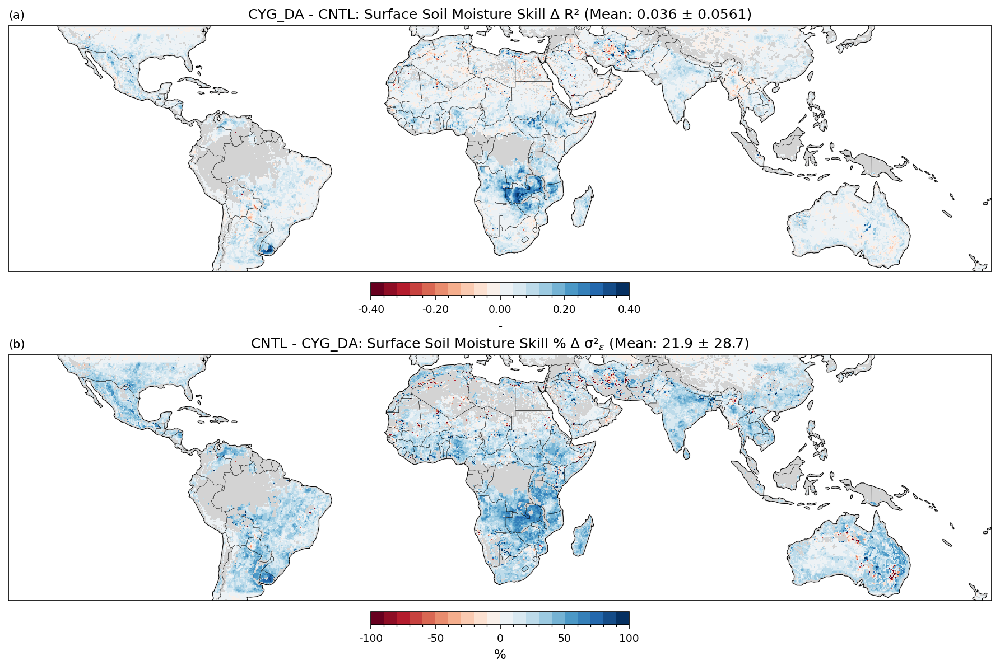

In [35]:
# Two-panel: Δ R²_mod and % Δ σ²_mod (CNTL-EXPT)
vals = [
    (dR2_mod, 'CYG_DA - CNTL: Surface Soil Moisture Skill Δ R²', 'RdBu', (-0.4, 0.4), '(a)', '-'),
    (pct_sig2_inv, 'CNTL - CYG_DA: Surface Soil Moisture Skill % Δ σ²$_ε$', 'RdBu', (-100.0, 100.0), '(b)', '%')
]
lats_ease, lons_ease = load_ease_grid(ease_path=DATA_DIR); lats_row, lons_col = lats_ease[:,1], lons_ease[1,:]
lon_grid, lat_grid = np.meshgrid(lons_col, lats_row)
map_array_tmp = np.empty([lons.size, 3]); map_array_tmp.fill(np.nan); map_array_tmp[:,1]=lons.flatten(); map_array_tmp[:,2]=lats.flatten()

fig, axes = plt.subplots(2, 1, figsize=(12, 8), subplot_kw={'projection': ccrs.PlateCarree()})
improvement_rows = []
for ax, (data_grid, title, cmap_name, clim, lab, units) in zip(axes, vals):
    vmin, vmax = clim
    edges = np.linspace(vmin, vmax, 21)
    cmap = get_cmap(cmap_name, len(edges)-1)
    norm = BoundaryNorm(edges, cmap.N)
    data_flat = data_grid.flatten()
    valid_mask = np.isfinite(data_flat)
    n_valid = int(valid_mask.sum())
    n_improved = int((data_flat[valid_mask] > 0).sum()) if n_valid > 0 else 0
    pct_improved = (100.0 * n_improved / n_valid) if n_valid > 0 else np.nan
    mean_val = np.nanmean(data_flat); std_val = np.nanstd(data_flat)
    map_array_tmp[:,0] = data_flat
    grid = build_ease_grid_mapping(map_array_tmp, lats_row, lons_col)
    sc = ax.pcolormesh(lon_grid, lat_grid, grid, cmap=cmap, norm=norm, transform=ccrs.PlateCarree())
    ax.add_feature(cfeature.COASTLINE, linewidth=0.5)
    ax.add_feature(cfeature.BORDERS, linewidth=0.3)
    ax.add_feature(cfeature.LAND, color='lightgray', zorder=0)
    ax.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
    ax.set_title(f"{title} (Mean: {mean_val:.3g} ± {std_val:.3g})")
    ax.text(0.0, 1.02, lab, transform=ax.transAxes, va='bottom', ha='left')
    metric_name = 'Δ R²_mod (DA - CNTL)' if units == '-' else '% Δ σ²_mod (CNTL - DA)'
    improvement_rows.append((lab, metric_name, n_improved, n_valid, pct_improved))
    ax.tick_params(labelbottom=False, labelleft=False)
    cbar = fig.colorbar(sc, ax=ax, orientation='horizontal', pad=0.04, fraction=0.046)
    cbar.set_label(units)
    cbar.set_ticks(edges[::5])
    cbar.ax.set_xticklabels([f"{t:.2f}" if units=='-' else f"{t:.0f}" for t in edges[::5]])

plt.tight_layout()
# Filename includes Nmin for traceability.
save_fig(plt.gcf(), f"figure_6_n{Nmin}_v2")
plt.show()
print('Improvement fractions (value > 0 among finite model cells):')
for panel, metric_name, n_improved, n_valid, pct_improved in improvement_rows:
    frac_str = f"{pct_improved:.1f}%" if np.isfinite(pct_improved) else "n/a"
    print(f"  {panel} {metric_name}: {n_improved:,}/{n_valid:,} ({frac_str})")

In [36]:
# ------------------------------
# 7) Figure S5 and Figure 7 (2x2 panels)
# ------------------------------
# Helpers

def box_by_bins(ax, df, col, title, ylabel):
    data, labels = [], []
    for lbl in df['bin'].cat.categories:
        vals = df.loc[df['bin'] == lbl, col].values
        data.append(vals)
        labels.append(f"{lbl.left:.2g}–{lbl.right:.2g} (n={len(vals):,})")
    ax.boxplot(data, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
    ax.axhline(0, ls='--', lw=1, color='gray')
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    for tick in ax.get_xticklabels():
        tick.set_rotation(20)
    ax.set_xlabel('CNTL Surface Moisture Skill σ²$_ε$ (m³/m³)²')


def box_cat(ax, cats, data, title, ylabel, labels_map=None, order=None, xrot=15):
    data_list = []
    labels = []
    if order is None:
        order = np.unique(cats[np.isfinite(cats)])
    for k in order:
        sel = np.isfinite(cats) & (cats == k) & np.isfinite(data)
        if sel.any():
            data_list.append(data[sel])
            lab = labels_map.get(k, str(k)) if labels_map else str(k)
            labels.append(f"{lab} (n={sel.sum():,})")
    ax.boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
    ax.axhline(0, ls='--', lw=1, color='gray')
    ax.set_title(title)
    ax.set_ylabel(ylabel)
    for tick in ax.get_xticklabels():
        tick.set_rotation(xrot)

# Sigma2 quintile bins (using CNTL sigma2_mod aligned to target grid)
sig20_flat = S0['sigma2_mod'].flatten()
tr_dR2_al = target_dR2
tr_pct_al = target_pct_sig2

sig20_al = sig20_flat[idxs]
mask = np.isfinite(sig20_al) & np.isfinite(tr_dR2_al) & np.isfinite(tr_pct_al)
sig20_al = sig20_al[mask]
tr_dR2_al = tr_dR2_al[mask]
tr_pct_al = tr_pct_al[mask]

tr_pct_inv_al = -tr_pct_al  # CNTL - CYG_DA normalized by CNTL

df_sig_inv = pd.DataFrame({
    'sig20': sig20_al,
    'dR²': tr_dR2_al,
    'pct': tr_pct_inv_al,
}).replace([np.inf, -np.inf], np.nan).dropna()

try:
    df_sig_inv['bin'] = pd.qcut(df_sig_inv['sig20'], q=5, duplicates='drop')
except Exception:
    df_sig_inv['bin'] = pd.cut(df_sig_inv['sig20'], bins=5)


lai_vals = np.clip(mean_lai_flat, 0, None)
ai_vals = np.clip(ai_flat, 0, None)

# base targets (AGU25-style mapping)
tr_dR2 = target_dR2
tr_pct = target_pct_sig2

# common mask to align lengths
min_len = min(len(tr_dR2), len(tr_pct), len(lai_vals), len(ai_vals))
tr_dR2_use = tr_dR2[:min_len]
tr_pct_use = tr_pct[:min_len]
lai_vals = lai_vals[:min_len]
ai_vals = ai_vals[:min_len]

mask_common = np.isfinite(tr_dR2_use) & np.isfinite(tr_pct_use) & np.isfinite(lai_vals) & np.isfinite(ai_vals)
tr_dR2_use = tr_dR2_use[mask_common]
tr_pct_use = tr_pct_use[mask_common]
lai_vals = lai_vals[mask_common]
ai_vals = ai_vals[mask_common]

# invert so positive = CNTL - CYG_DA
tr_pct_use = -tr_pct_use

lai_bins = [0.0, 0.10, 0.50, 1.30, 2.60, np.inf]

In [37]:
# ------------------------------
# 8) Figure S6 (4x1 maps)
# ------------------------------
vmin_sig2, vmax_sig2 = 0.0, 2e-3
edges_sig2 = np.linspace(vmin_sig2, vmax_sig2, 21)
cmap_sig2 = get_cmap('YlGnBu', len(edges_sig2) - 1)

lats_ease, lons_ease = load_ease_grid(ease_path=DATA_DIR)
lats_row, lons_col = lats_ease[:, 1], lons_ease[1, :]
lon_grid, lat_grid = np.meshgrid(lons_col, lats_row)

# Helper to map lon/lat/value triplets to the EASE grid

def to_grid(values, lon_in, lat_in):
    arr = np.column_stack([values.flatten(), lon_in.flatten(), lat_in.flatten()])
    return build_ease_grid_mapping(arr, lats_row, lons_col)

# (a) CNTL sigma2 grid (uses TC lon/lat grid)
map_sig = np.empty([lons_tc_grid.size, 3])
map_sig.fill(np.nan)
map_sig[:, 0] = np.asarray(S0.get('sigma2_mod', np.nan)).flatten()
map_sig[:, 1] = lons_tc_grid.flatten()
map_sig[:, 2] = lats_tc_grid.flatten()

sig2_grid = build_ease_grid_mapping(map_sig, lats_row, lons_col)

# (c) Mean LAI grid (aridity/LAI lon/lat)
lai_grid = to_grid(np.squeeze(mean_lai_clim), np.squeeze(lon_ai), np.squeeze(lat_ai))
edges_lai = np.linspace(0.0, 6.0, 21)
cmap_lai = get_cmap('YlGn', len(edges_lai) - 1)

# (d) Aridity grid
ai_grid = to_grid(np.squeeze(ai), np.squeeze(lon_ai), np.squeeze(lat_ai))
a_edges = np.array([0.00, 0.05, 0.10, 0.20, 0.30, 0.40, 0.50, 0.60, 0.70, 0.80, 0.90, 1.00, 1.10, 1.20, 1.30, 1.40, 1.50, 1.75, 2.00, 3.00, 5.00, 10.00])
cmap_ai = get_cmap('Spectral', len(a_edges) - 1)

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/4189372547.py:6: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_sig2 = get_cmap('YlGnBu', len(edges_sig2) - 1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/4189372547.py:30: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap_lai = get_cmap('YlGn', len(edges_lai) - 1)
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/4189372547.py:35: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/760067642.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/3759000612.py:19: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes_pct[1].boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/3759000612.py:42: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes_pct[2].boxplot(data_list, labels

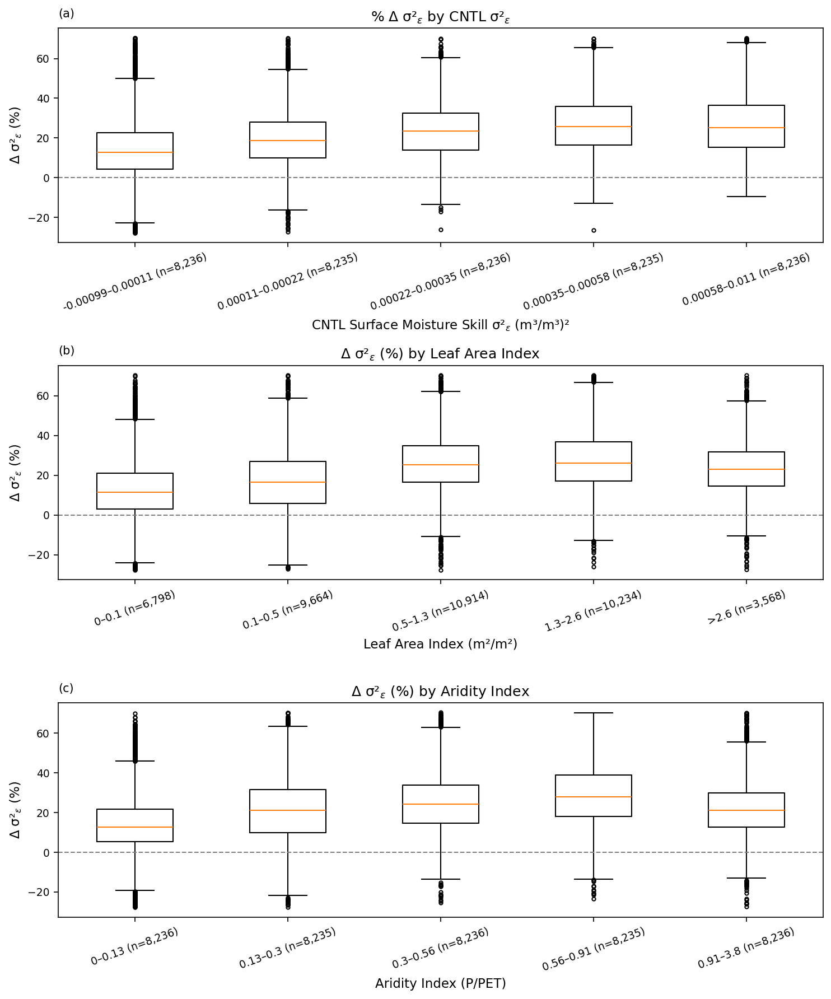

In [38]:
# Figure 7: % Δ sigma² (3x1)
fig_pct, axes_pct = plt.subplots(3, 1, figsize=(10, 12))
axes_pct = axes_pct.flatten()

box_by_bins(axes_pct[0], df_sig_inv, 'pct', '% Δ σ²$_ε$ by CNTL σ²$_ε$', 'Δ σ²$_ε$ (%)')

lai_df = pd.DataFrame({'lai': lai_vals, 'pct': tr_pct_use}).replace([np.inf, -np.inf], np.nan).dropna(subset=['lai'])
lai_df['bin'] = pd.cut(lai_df['lai'], bins=lai_bins, include_lowest=True)

data_list = []
labels = []
for lbl in lai_df['bin'].cat.categories:
    vals = lai_df.loc[lai_df['bin'] == lbl, 'pct'].dropna().values
    left = max(0, lbl.left)
    right = lbl.right if lbl.right != float('inf') else np.inf
    lab = f"{left:.2g}–{right:.2g}" if right != np.inf else f">{left:.2g}"
    data_list.append(vals)
    labels.append(f"{lab} (n={len(vals):,})")
axes_pct[1].boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
axes_pct[1].axhline(0, ls='--', lw=1, color='gray')
axes_pct[1].set_title('Δ σ²$_ε$ (%) by Leaf Area Index')
axes_pct[1].set_ylabel('Δ σ²$_ε$ (%)')
axes_pct[1].set_xlabel('Leaf Area Index (m²/m²)')
for tick in axes_pct[1].get_xticklabels():
    tick.set_rotation(20)

ai_df = pd.DataFrame({'ai': ai_vals, 'pct': tr_pct_use}).replace([np.inf, -np.inf], np.nan).dropna()
try:
    ai_df['bin'] = pd.qcut(ai_df['ai'], q=5, duplicates='drop')
except Exception:
    ai_df['bin'] = pd.cut(ai_df['ai'], bins=5)

data_list = []
labels = []
for lbl in ai_df['bin'].cat.categories:
    vals = ai_df.loc[ai_df['bin'] == lbl, 'pct'].dropna().values
    left = max(0, lbl.left)
    right = lbl.right if lbl.right != float('inf') else np.inf
    lab = f"{left:.2g}–{right:.2g}" if right != np.inf else f">{left:.2g}"
    data_list.append(vals)
    labels.append(f"{lab} (n={len(vals):,})")
axes_pct[2].boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
axes_pct[2].axhline(0, ls='--', lw=1, color='gray')
axes_pct[2].set_title('Δ σ²$_ε$ (%) by Aridity Index')
axes_pct[2].set_ylabel('Δ σ²$_ε$ (%)')
axes_pct[2].set_xlabel('Aridity Index (P/PET)')
for tick in axes_pct[2].get_xticklabels():
    tick.set_rotation(20)

for ax, lab in zip(axes_pct, ['(a)', '(b)', '(c)']):
    ax.text(0.0, 1.04, lab, transform=ax.transAxes, va='bottom', ha='left')

plt.tight_layout()
# Filename includes Nmin for traceability.
save_fig(plt.gcf(), f"figure_7_n{Nmin}_v2")
plt.show()

/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: invalid value encountered in create_collection
  return lib.create_collection(geometries, np.intc(typ), out=out, **kwargs)
/Users/amfox/mamba/envs/regrid/lib/python3.11/site-packages/shapely/creation.py:730: RuntimeWarning: inv

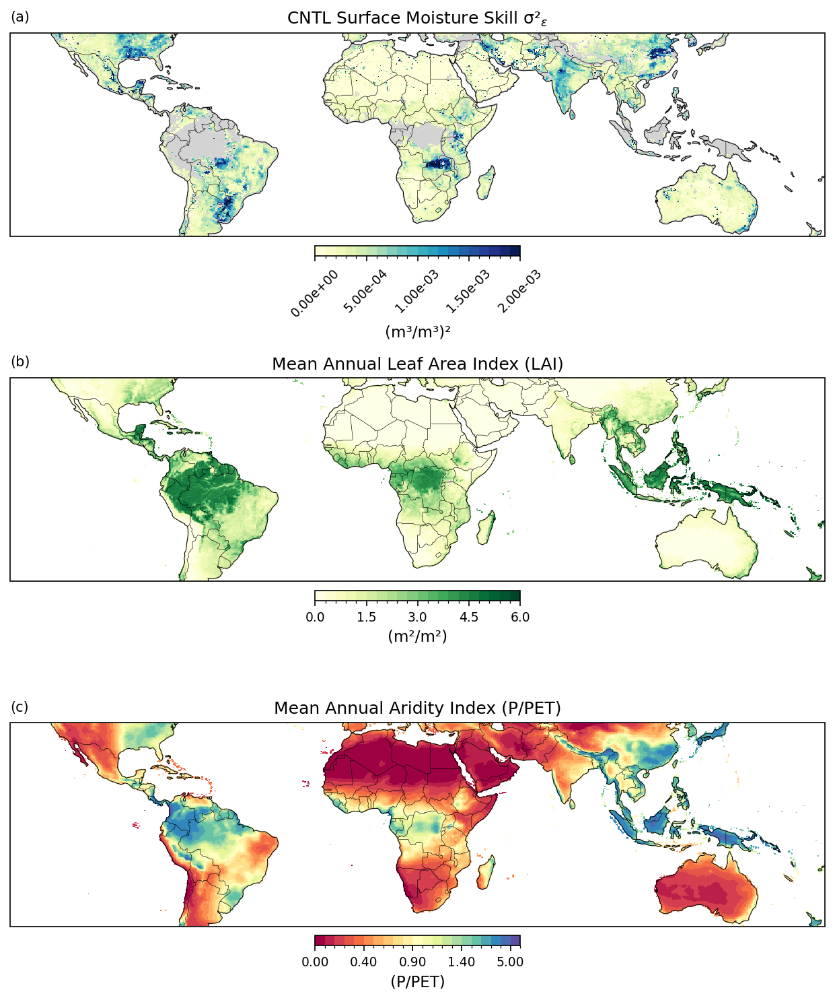

In [39]:
# Figure S5 (3x1 maps, exclude primary vegetation type)
fig, axes = plt.subplots(3, 1, figsize=(12, 10), subplot_kw={'projection': ccrs.PlateCarree()})

# (a) CNTL sigma2 map
ax0 = axes[0]
sc0 = ax0.pcolormesh(lon_grid, lat_grid, sig2_grid, cmap=cmap_sig2, norm=BoundaryNorm(edges_sig2, cmap_sig2.N), transform=ccrs.PlateCarree())
ax0.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax0.add_feature(cfeature.BORDERS, linewidth=0.3)
ax0.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax0.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
ax0.set_title('CNTL Surface Moisture Skill σ²$_ε$')
ax0.text(0.0, 1.04, '(a)', transform=ax0.transAxes, va='bottom', ha='left')
ax0.tick_params(labelbottom=False, labelleft=False)

cbar0 = fig.colorbar(sc0, ax=ax0, orientation='horizontal', pad=0.04, fraction=0.046)
cbar0.set_label('(m³/m³)²')
cbar0.set_ticks(edges_sig2[::5])
cbar0.ax.set_xticklabels([f"{t:.2e}" for t in edges_sig2[::5]], rotation=45)

# (b) Mean LAI
ax1 = axes[1]
sc1 = ax1.pcolormesh(lon_grid, lat_grid, lai_grid, cmap=cmap_lai, norm=BoundaryNorm(edges_lai, cmap_lai.N), transform=ccrs.PlateCarree())
ax1.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax1.add_feature(cfeature.BORDERS, linewidth=0.3)
ax1.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax1.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
ax1.set_title('Mean Annual Leaf Area Index (LAI)')
ax1.text(0.0, 1.04, '(b)', transform=ax1.transAxes, va='bottom', ha='left')
ax1.tick_params(labelbottom=False, labelleft=False)

cbar1 = fig.colorbar(sc1, ax=ax1, orientation='horizontal', pad=0.04, fraction=0.046)
cbar1.set_label('(m²/m²)')
cbar1.set_ticks(edges_lai[::5])
cbar1.ax.set_xticklabels([f"{t:.1f}" for t in edges_lai[::5]])

# (c) Aridity
ax2 = axes[2]
sc2 = ax2.pcolormesh(lon_grid, lat_grid, ai_grid, cmap=cmap_ai, norm=BoundaryNorm(a_edges, cmap_ai.N), transform=ccrs.PlateCarree())
ax2.add_feature(cfeature.COASTLINE, linewidth=0.5)
ax2.add_feature(cfeature.BORDERS, linewidth=0.3)
ax2.add_feature(cfeature.LAND, color='lightgray', zorder=0)
ax2.set_extent(REGION_BOUNDS['cygnss'], crs=ccrs.PlateCarree())
ax2.set_title('Mean Annual Aridity Index (P/PET)')
ax2.text(0.0, 1.04, '(c)', transform=ax2.transAxes, va='bottom', ha='left')
ax2.tick_params(labelbottom=False, labelleft=False)

cbar2 = fig.colorbar(sc2, ax=ax2, orientation='horizontal', pad=0.04, fraction=0.046, boundaries=a_edges)
cbar2.set_label('(P/PET)')
positions = a_edges[::5]
cbar2.set_ticks(positions)
cbar2.ax.set_xticklabels([f"{t:.2f}" for t in positions])

plt.tight_layout()
save_fig(plt.gcf(), 'figure_S5')
plt.show()

/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/760067642.py:12: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  ax.boxplot(data, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/1999954045.py:21: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes_r2[1].boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
/var/folders/p3/6g36x17x60d12xdgb49ryq4r0000gr/T/ipykernel_96056/1999954045.py:45: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  axes_r2[2].boxplot(data_list, labels=l

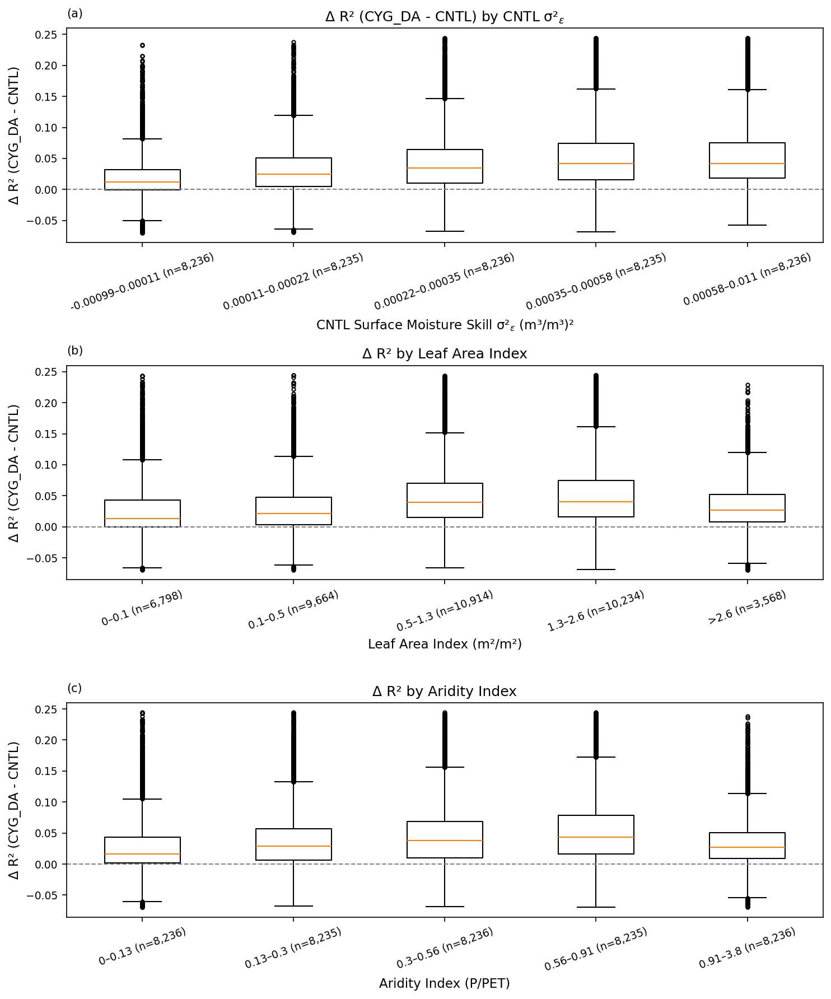

In [40]:
# Figure S6: Δ R² (3x1)
fig_r2, axes_r2 = plt.subplots(3, 1, figsize=(10, 12))
axes_r2 = axes_r2.flatten()

box_by_bins(axes_r2[0], df_sig_inv, 'dR²', 'Δ R² (CYG_DA - CNTL) by CNTL σ²$_ε$', 'Δ R² (CYG_DA - CNTL)')

# LAI panel
lai_bins = [0.0, 0.10, 0.50, 1.30, 2.60, np.inf]
lai_df = pd.DataFrame({'lai': lai_vals, 'dR²': tr_dR2_use}).replace([np.inf, -np.inf], np.nan).dropna(subset=['lai'])
lai_df['bin'] = pd.cut(lai_df['lai'], bins=lai_bins, include_lowest=True)

data_list = []
labels = []
for lbl in lai_df['bin'].cat.categories:
    vals = lai_df.loc[lai_df['bin'] == lbl, 'dR²'].dropna().values
    left = max(0, lbl.left)
    right = lbl.right if lbl.right != float('inf') else np.inf
    lab = f"{left:.2g}–{right:.2g}" if right != np.inf else f">{left:.2g}"
    data_list.append(vals)
    labels.append(f"{lab} (n={len(vals):,})")
axes_r2[1].boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
axes_r2[1].axhline(0, ls='--', lw=1, color='gray')
axes_r2[1].set_title('Δ R² by Leaf Area Index')
axes_r2[1].set_ylabel('Δ R² (CYG_DA - CNTL)')
axes_r2[1].set_xlabel('Leaf Area Index (m²/m²)')
for tick in axes_r2[1].get_xticklabels():
    tick.set_rotation(20)

# Aridity panel
ai_df = pd.DataFrame({'ai': ai_vals, 'dR²': tr_dR2_use}).replace([np.inf, -np.inf], np.nan).dropna()
try:
    ai_df['bin'] = pd.qcut(ai_df['ai'], q=5, duplicates='drop')
except Exception:
    ai_df['bin'] = pd.cut(ai_df['ai'], bins=5)

data_list = []
labels = []
for lbl in ai_df['bin'].cat.categories:
    vals = ai_df.loc[ai_df['bin'] == lbl, 'dR²'].dropna().values
    left = max(0, lbl.left)
    right = lbl.right if lbl.right != float('inf') else np.inf
    lab = f"{left:.2g}–{right:.2g}" if right != np.inf else f">{left:.2g}"
    data_list.append(vals)
    labels.append(f"{lab} (n={len(vals):,})")
axes_r2[2].boxplot(data_list, labels=labels, showfliers=True, flierprops={'markersize': 3, 'marker': 'o'})
axes_r2[2].axhline(0, ls='--', lw=1, color='gray')
axes_r2[2].set_title('Δ R² by Aridity Index')
axes_r2[2].set_ylabel('Δ R² (CYG_DA - CNTL)')
axes_r2[2].set_xlabel('Aridity Index (P/PET)')
for tick in axes_r2[2].get_xticklabels():
    tick.set_rotation(20)

for ax, lab in zip(axes_r2, ['(a)', '(b)', '(c)']):
    ax.text(0.0, 1.04, lab, transform=ax.transAxes, va='bottom', ha='left')

plt.tight_layout()
save_fig(plt.gcf(), 'figure_S6')
plt.show()